In [1]:
import os
os.chdir("..")

In [2]:
import pickle
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from scipy.ndimage import gaussian_filter, median_filter, laplace
from scipy.fft import fft2, ifft2, fftshift, ifftshift
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix


from src.data.extract import read_image
from src.descriptors import hsv, lab, ycbcr
from src.visualization.plots import display_image, display_histogram

In [3]:
augmentations_filepath = "data/raw/qsd1_w3/augmentations.pkl"
frames_filepath = "data/raw/qsd1_w3/frames.pkl"
gt_corresps_filepath = "data/raw/qsd1_w3/gt_corresps.pkl"

In [4]:
data_folder = "data/raw/qsd1_w3"
gt_data_folder = "data/raw/qsd1_w3/non_augmented"

In [5]:
clear_img_name = "00004.jpg"
noisy_img_name = "00005.jpg"

In [6]:
with open(augmentations_filepath, 'rb') as f:
    augmentations = pickle.load(f)
with open(frames_filepath, 'rb') as f:
    frames = pickle.load(f)
with open(gt_corresps_filepath, 'rb') as f:
    gt_corresps = pickle.load(f)

In [8]:
augmentations

['None-MultiplyHue',
 'None',
 'None-MultiplyHue',
 'None-MultiplyHue',
 'None',
 'UnnamedImpulseNoise',
 'UnnamedImpulseNoise',
 'None-MultiplyHue',
 'None',
 'None-MultiplyHue',
 'None',
 'None',
 'None-MultiplyHue',
 'None-MultiplyHue',
 'None-MultiplyHue',
 'None-MultiplyHue',
 'UnnamedImpulseNoise',
 'None-MultiplyHue',
 'UnnamedImpulseNoise',
 'None-MultiplyHue',
 'UnnamedImpulseNoise',
 'None',
 'None',
 'UnnamedImpulseNoise',
 'None',
 'None-MultiplyHue',
 'None-MultiplyHue',
 'None',
 'None-MultiplyHue',
 'UnnamedImpulseNoise']

In [9]:
clear_img = read_image(os.path.join(data_folder, clear_img_name))
clear_img_gt = read_image(os.path.join(gt_data_folder, clear_img_name))

noisy_img = read_image(os.path.join(data_folder, noisy_img_name))
noisy_img_gt = read_image(os.path.join(gt_data_folder, noisy_img_name))

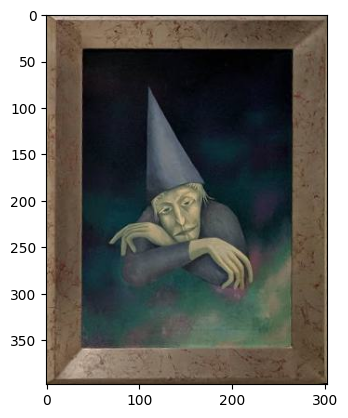

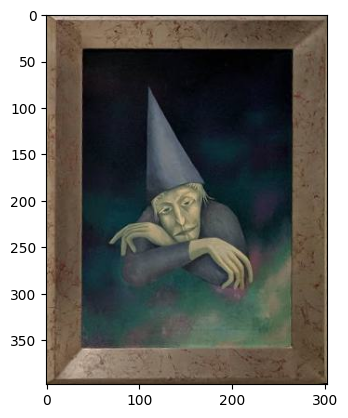

In [10]:
display_image(clear_img)
display_image(clear_img_gt)


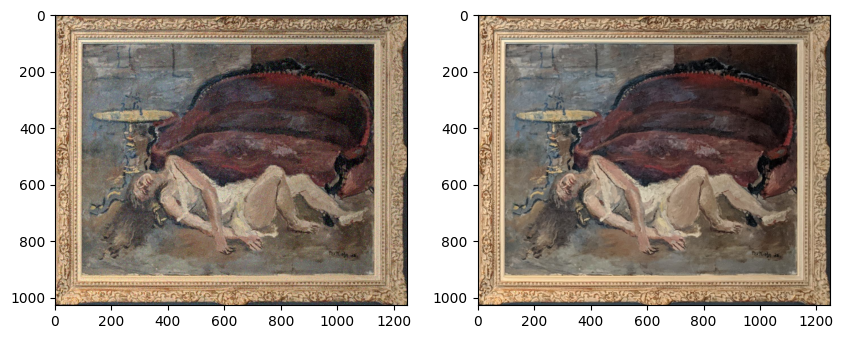

In [10]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # right side
display_image(noisy_img, ax1)
display_image(noisy_img_gt, ax2)
plt.show()


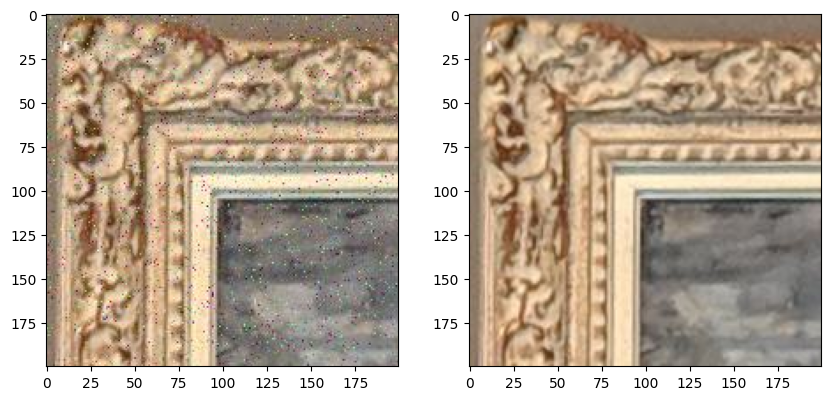

In [11]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # right side
display_image(noisy_img[:200,:200,:], ax1)
display_image(noisy_img_gt[:200,:200,:], ax2)
plt.show()

### Compare color spaces

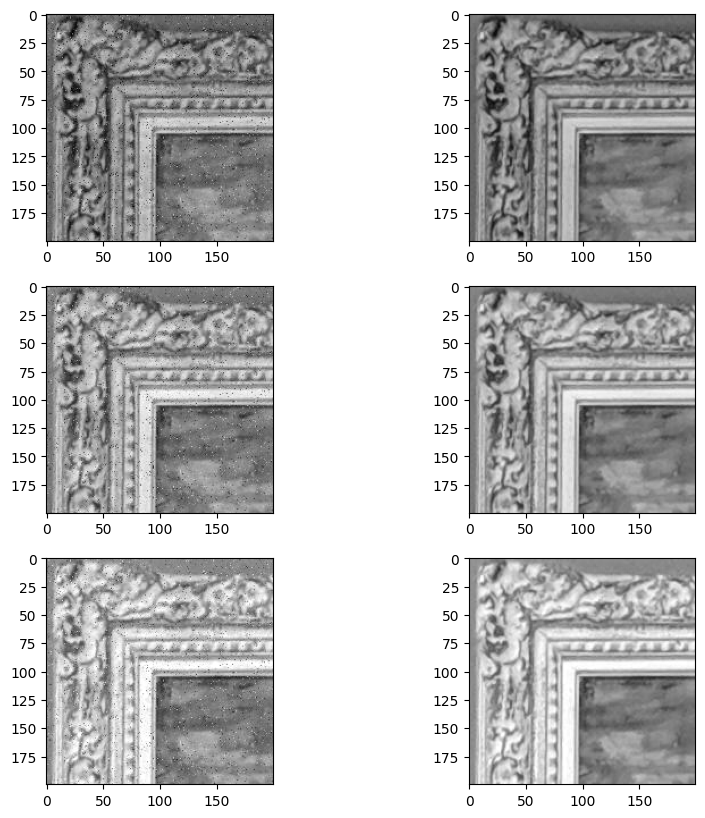

In [12]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)
ax6 = fig.add_subplot(326)
# channel B
display_image(noisy_img[:200,:200,0], ax1)
display_image(noisy_img_gt[:200,:200,0], ax2)
# channel G
display_image(noisy_img[:200,:200,1], ax3)
display_image(noisy_img_gt[:200,:200,1], ax4)
# channel R
display_image(noisy_img[:200,:200,2], ax5)
display_image(noisy_img_gt[:200,:200,2], ax6)
plt.show()

In [13]:
print(peak_signal_noise_ratio(clear_img_gt, clear_img))
print(structural_similarity(clear_img_gt, clear_img, channel_axis=2))

# channel B
print(peak_signal_noise_ratio(clear_img_gt[:,:,0], clear_img[:,:,0]))
print(structural_similarity(clear_img_gt[:,:,0], clear_img[:,:,0]))

# channel G
print(peak_signal_noise_ratio(clear_img_gt[:,:,1], clear_img[:,:,1]))
print(structural_similarity(clear_img_gt[:,:,1], clear_img[:,:,1]))

# channel R
print(peak_signal_noise_ratio(clear_img_gt[:,:,2], clear_img[:,:,2]))
print(structural_similarity(clear_img_gt[:,:,2], clear_img[:,:,2]))

inf
1.0
inf
1.0
inf
1.0
inf
1.0


/Users/marina.rosell/Documents/master/C1/Team5/.venv/lib/python3.13/site-packages/skimage/metrics/simple_metrics.py:168: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)


In [14]:
print(peak_signal_noise_ratio(noisy_img_gt, noisy_img))
print(structural_similarity(noisy_img_gt, noisy_img, channel_axis=2))

# channel B
print(peak_signal_noise_ratio(noisy_img_gt[:,:,0], noisy_img[:,:,0]))
print(structural_similarity(noisy_img_gt[:,:,0], noisy_img[:,:,0]))

# channel G
print(peak_signal_noise_ratio(noisy_img_gt[:,:,1], noisy_img[:,:,1]))
print(structural_similarity(noisy_img_gt[:,:,1], noisy_img[:,:,1]))

# channel R
print(peak_signal_noise_ratio(noisy_img_gt[:,:,2], noisy_img[:,:,2]))
print(structural_similarity(noisy_img_gt[:,:,2], noisy_img[:,:,2]))

24.29165523734892
0.5863065329980667
24.25906517138818
0.5761224413149338
24.33475294434541
0.5918622415926357
24.28149521346844
0.5909349160866307


In [15]:
print(peak_signal_noise_ratio(noisy_img_gt, noisy_img_gt))
print(structural_similarity(noisy_img_gt, noisy_img_gt, channel_axis=2))

inf
1.0


In [16]:
# convert images to lab

clear_img_lab = lab.convert_img_to_lab(clear_img)
clear_img_gt_lab = lab.convert_img_to_lab(clear_img_gt)

noisy_img_lab = lab.convert_img_to_lab(noisy_img)
noisy_img_gt_lab = lab.convert_img_to_lab(noisy_img_gt)

In [17]:
# convert images to hsv

clear_img_hsv = hsv.convert_img_to_hsv(clear_img)
clear_img_gt_hsv = hsv.convert_img_to_hsv(clear_img_gt)

noisy_img_hsv = hsv.convert_img_to_hsv(noisy_img)
noisy_img_gt_hsv = hsv.convert_img_to_hsv(noisy_img_gt)

In [18]:
# convert images to ycbcr

clear_img_ycbcr = ycbcr.convert_img_to_ycbcr(clear_img)
clear_img_gt_ycbcr = ycbcr.convert_img_to_ycbcr(clear_img_gt)

noisy_img_ycbcr = ycbcr.convert_img_to_ycbcr(noisy_img)
noisy_img_gt_ycbcr = ycbcr.convert_img_to_ycbcr(noisy_img_gt)

In [19]:
print(peak_signal_noise_ratio(clear_img_gt_hsv, clear_img_hsv))
print(structural_similarity(clear_img_gt_hsv, clear_img_hsv, channel_axis=2))

# channel H
print(peak_signal_noise_ratio(clear_img_gt_hsv[:,:,0], clear_img_hsv[:,:,0]))
print(structural_similarity(clear_img_gt_hsv[:,:,0], clear_img_hsv[:,:,0]))

# channel S
print(peak_signal_noise_ratio(clear_img_gt_hsv[:,:,1], clear_img_hsv[:,:,1]))
print(structural_similarity(clear_img_gt_hsv[:,:,1], clear_img_hsv[:,:,1]))

# channel V
print(peak_signal_noise_ratio(clear_img_gt_hsv[:,:,2], clear_img_hsv[:,:,2]))
print(structural_similarity(clear_img_gt_hsv[:,:,2], clear_img_hsv[:,:,2]))

inf
1.0
inf
1.0
inf
1.0
inf
1.0


In [20]:
print(peak_signal_noise_ratio(noisy_img_gt_hsv, noisy_img_hsv))
print(structural_similarity(noisy_img_gt_hsv, noisy_img_hsv, channel_axis=2))

# channel H
print(peak_signal_noise_ratio(noisy_img_gt_hsv[:,:,0], noisy_img_hsv[:,:,0]))
print(structural_similarity(noisy_img_gt_hsv[:,:,0], noisy_img_hsv[:,:,0]))

# channel S
print(peak_signal_noise_ratio(noisy_img_gt_hsv[:,:,1], noisy_img_hsv[:,:,1]))
print(structural_similarity(noisy_img_gt_hsv[:,:,1], noisy_img_hsv[:,:,1]))

# channel V
print(peak_signal_noise_ratio(noisy_img_gt_hsv[:,:,2], noisy_img_hsv[:,:,2]))
print(structural_similarity(noisy_img_gt_hsv[:,:,2], noisy_img_hsv[:,:,2]))

17.503907621643442
0.5508676047991398
13.923094424547573
0.5289881480236555
20.44839105449293
0.5338366509482636
24.248837426330393
0.5897780154255003


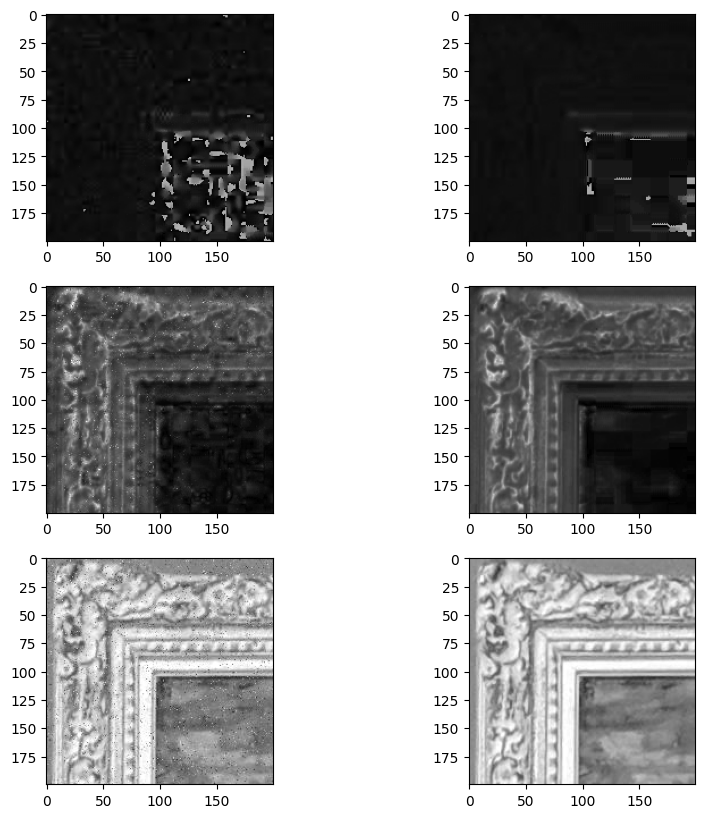

In [21]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)
ax6 = fig.add_subplot(326)
display_image(noisy_img_hsv[:200,:200,0], ax1)
display_image(noisy_img_gt_hsv[:200,:200,0], ax2)
display_image(noisy_img_hsv[:200,:200,1], ax3)
display_image(noisy_img_gt_hsv[:200,:200,1], ax4)
display_image(noisy_img_hsv[:200,:200,2], ax5)
display_image(noisy_img_gt_hsv[:200,:200,2], ax6)
plt.show()

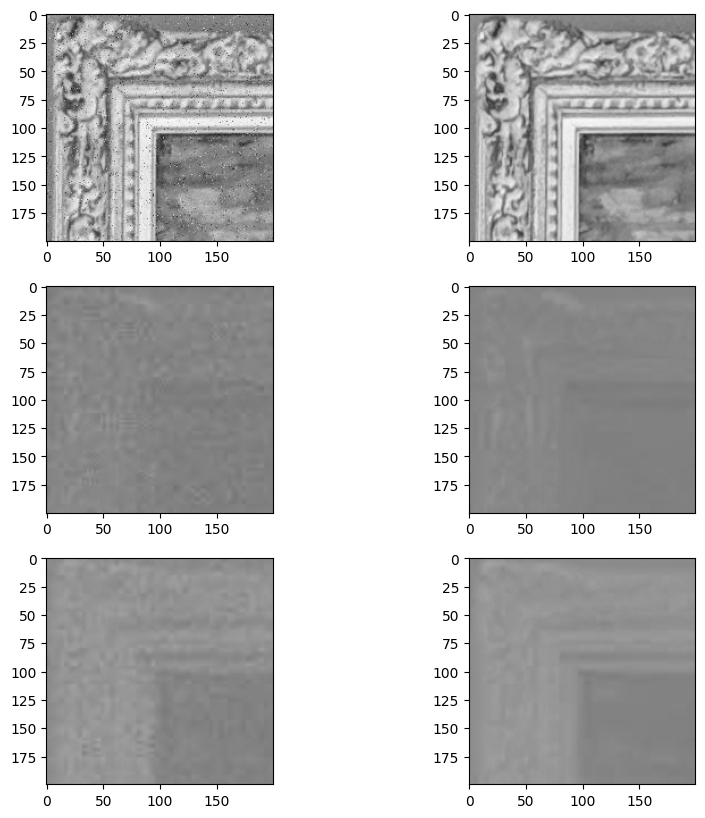

In [22]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)
ax6 = fig.add_subplot(326)
display_image(noisy_img_lab[:200,:200,0], ax1)
display_image(noisy_img_gt_lab[:200,:200,0], ax2)
display_image(noisy_img_lab[:200,:200,1], ax3)
display_image(noisy_img_gt_lab[:200,:200,1], ax4)
display_image(noisy_img_lab[:200,:200,2], ax5)
display_image(noisy_img_gt_lab[:200,:200,2], ax6)
plt.show()

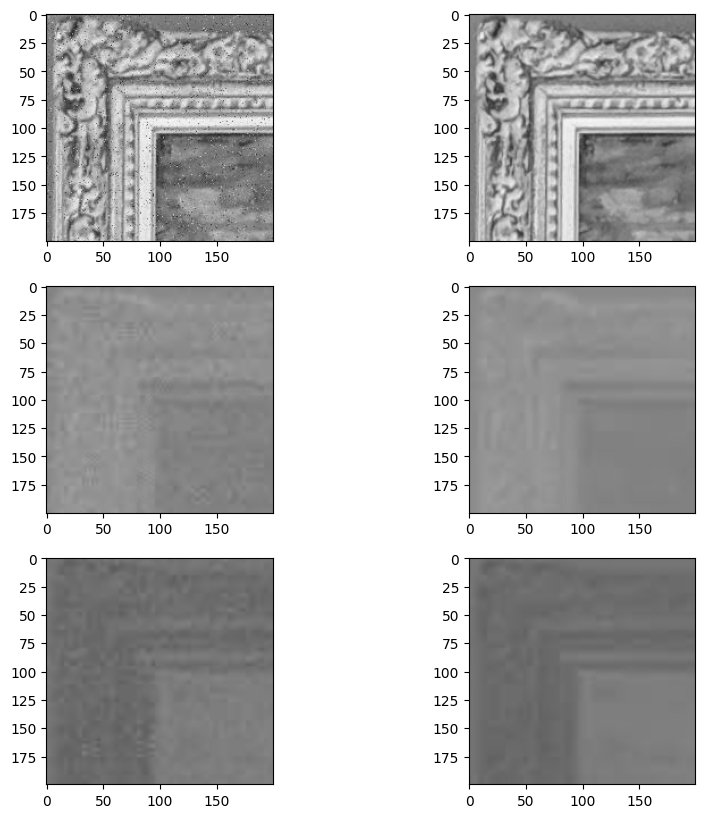

In [23]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)
ax6 = fig.add_subplot(326)
display_image(noisy_img_ycbcr[:200,:200,0], ax1)
display_image(noisy_img_gt_ycbcr[:200,:200,0], ax2)
display_image(noisy_img_ycbcr[:200,:200,1], ax3)
display_image(noisy_img_gt_ycbcr[:200,:200,1], ax4)
display_image(noisy_img_ycbcr[:200,:200,2], ax5)
display_image(noisy_img_gt_ycbcr[:200,:200,2], ax6)
plt.show()

### Gaussian filter

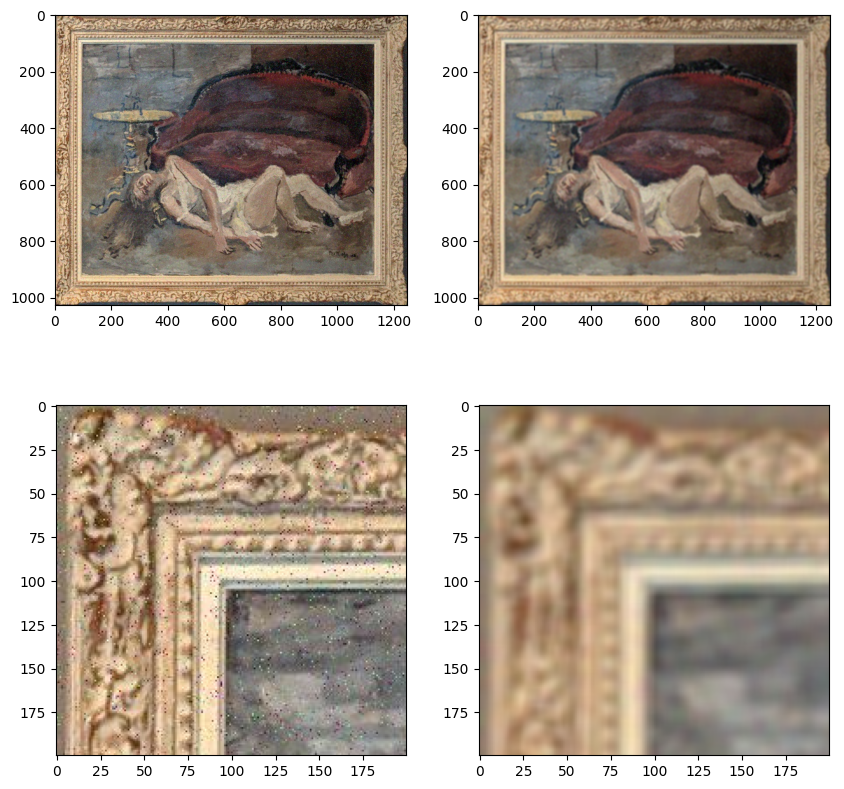

In [24]:
# gaussian filter
noisy_img_gaussian_filter = gaussian_filter(noisy_img, sigma=5, radius=4, axes=(0,1))

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)  # left side
ax2 = fig.add_subplot(222)  # right side
display_image(noisy_img, ax1)
display_image(noisy_img_gaussian_filter, ax2)
ax3 = fig.add_subplot(223)  # left side
ax4 = fig.add_subplot(224)  # right side
display_image(noisy_img[:200, :200, :], ax3)
display_image(noisy_img_gaussian_filter[:200, :200, :], ax4)
plt.show()


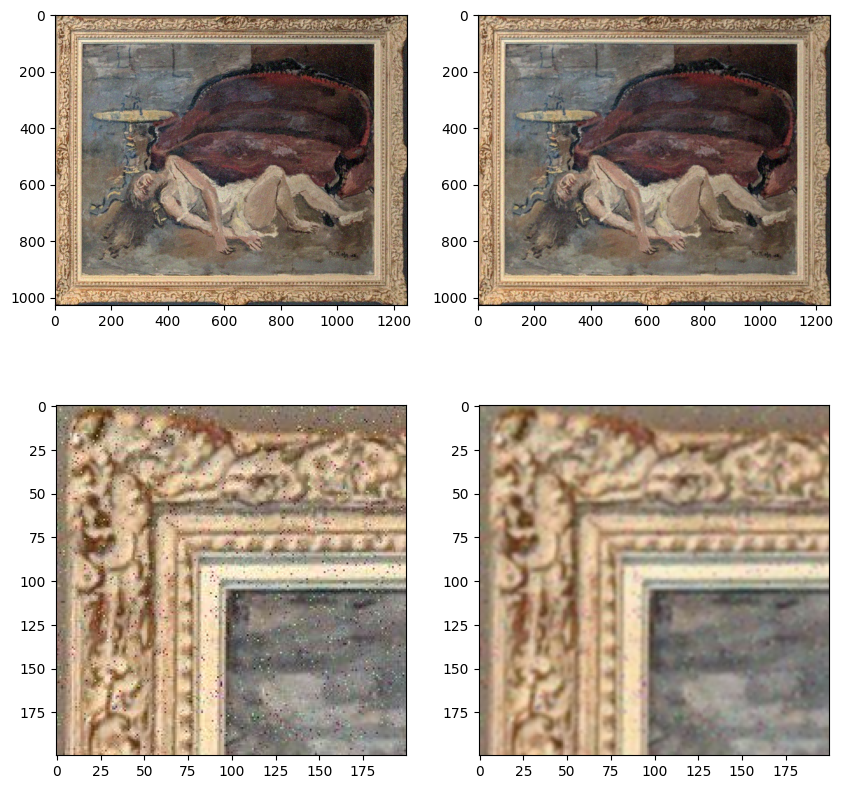

In [25]:
# gaussian filter
noisy_img_gaussian_filter = gaussian_filter(noisy_img, sigma=1, radius=1, axes=(0,1))

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)  # left side
ax2 = fig.add_subplot(222)  # right side
display_image(noisy_img, ax1)
display_image(noisy_img_gaussian_filter, ax2)
ax3 = fig.add_subplot(223)  # left side
ax4 = fig.add_subplot(224)  # right side
display_image(noisy_img[:200, :200, :], ax3)
display_image(noisy_img_gaussian_filter[:200, :200, :], ax4)
plt.show()


In [26]:
print(peak_signal_noise_ratio(noisy_img_gt, noisy_img))
print(structural_similarity(noisy_img_gt, noisy_img, channel_axis=2))

24.29165523734892
0.5863065329980667


In [27]:
print(peak_signal_noise_ratio(noisy_img_gt, noisy_img_gaussian_filter))
print(structural_similarity(noisy_img_gt, noisy_img_gaussian_filter, channel_axis=2))

30.14115554277351
0.8268080959033672


In [28]:
# grid search to find the best sigma and radius
results = []
for sigma in range(20):
    for radius in range(20):
        noisy_img_gaussian_filter = gaussian_filter(noisy_img, sigma=sigma, radius=radius, axes=(0,1))
        psne = peak_signal_noise_ratio(noisy_img_gt, noisy_img_gaussian_filter)
        ssim = structural_similarity(noisy_img_gt, noisy_img_gaussian_filter, channel_axis=2)
        results.append({
            "sigma": sigma,
            "radius": radius,
            "psne": psne,
            "ssim": ssim
        })
df_gaussian = pd.DataFrame(results)

In [29]:
sns.set_theme()

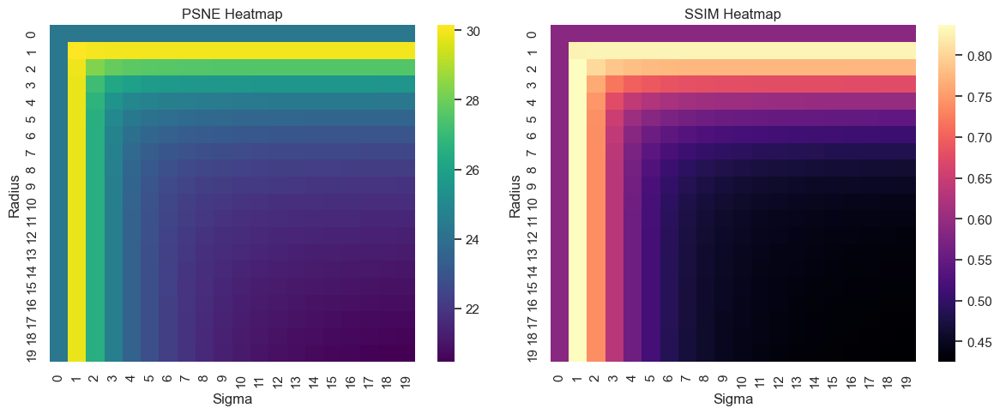

In [30]:
fig = plt.figure(figsize=(12,5))
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # right side

# Create pivot tables
psne_pivot = df_gaussian.pivot(index='radius', columns='sigma', values='psne')
ssim_pivot = df_gaussian.pivot(index='radius', columns='sigma', values='ssim')

# Plot PSNE heatmap
sns.heatmap(psne_pivot, cmap='viridis', ax=ax1)
ax1.set_title('PSNE Heatmap')
ax1.set_xlabel('Sigma')
ax1.set_ylabel('Radius')

# Plot SSIM heatmap
sns.heatmap(ssim_pivot, cmap='magma', ax=ax2)
ax2.set_title('SSIM Heatmap')
ax2.set_xlabel('Sigma')
ax2.set_ylabel('Radius')

plt.tight_layout()
plt.show()


In [31]:
# best results: sigma=1, radius=1
noisy_img_gaussian_filter = gaussian_filter(noisy_img, sigma=1, radius=1, axes=(0,1))
print(peak_signal_noise_ratio(noisy_img_gt, noisy_img_gaussian_filter))
print(structural_similarity(noisy_img_gt, noisy_img_gaussian_filter, channel_axis=2))

30.14115554277351
0.8268080959033672


### Median filter

#### BGR

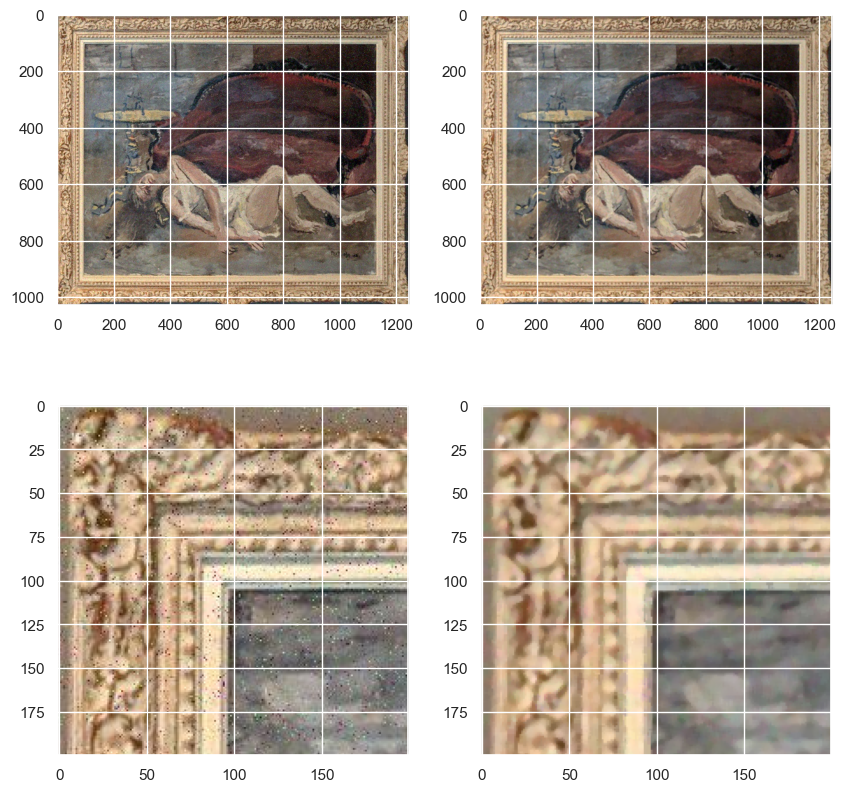

In [32]:
# median filter
noisy_img_median_filter = median_filter(noisy_img, size=4, axes=(0,1))

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)  # left side
ax2 = fig.add_subplot(222)  # right side
display_image(noisy_img, ax1)
display_image(noisy_img_median_filter, ax2)
ax3 = fig.add_subplot(223)  # left side
ax4 = fig.add_subplot(224)  # right side
display_image(noisy_img[:200, :200, :], ax3)
display_image(noisy_img_median_filter[:200, :200, :], ax4)
plt.show()


In [41]:
# grid search to find the best size
results = []
for size in range(1, 20):
    noisy_img_median_filter = median_filter(noisy_img, size=size, axes=(0,1))
    psne = peak_signal_noise_ratio(noisy_img_gt, noisy_img_median_filter)
    ssim = structural_similarity(noisy_img_gt, noisy_img_median_filter, channel_axis=2)
    results.append({
        "size": size,
        "psne": psne,
        "ssim": ssim
    })

df_median = pd.DataFrame(results)

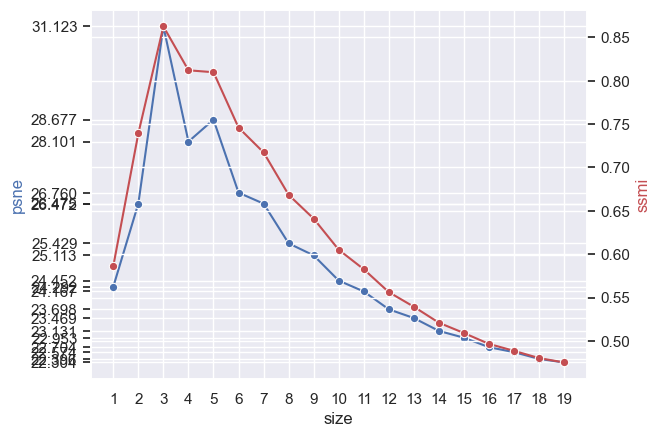

In [42]:
fig, ax1 = plt.subplots() # initializes figure and plots
ax2 = ax1.twinx()

sns.lineplot(df_median[['size','psne']], x='size', y='psne', marker='o', ax=ax1, color='b')
ax1.set(xticks=df_median['size'].values)
ax1.set(yticks=df_median['psne'].values)
sns.lineplot(df_median[['size','ssim']], x='size', y='ssim', marker='o', ax=ax2, color='r')

ax1.set_ylabel('psne', color='b')
ax2.set_ylabel('ssmi', color='r')

plt.xlabel('filter size')
plt.show()

In [35]:
# best result is size=3
noisy_img_median_filter = median_filter(noisy_img, size=3, axes=(0,1))
print(peak_signal_noise_ratio(noisy_img_gt, noisy_img_median_filter))
print(structural_similarity(noisy_img_gt, noisy_img_median_filter, channel_axis=2))

31.12301101435129
0.8624915207551785


#### YCbCr

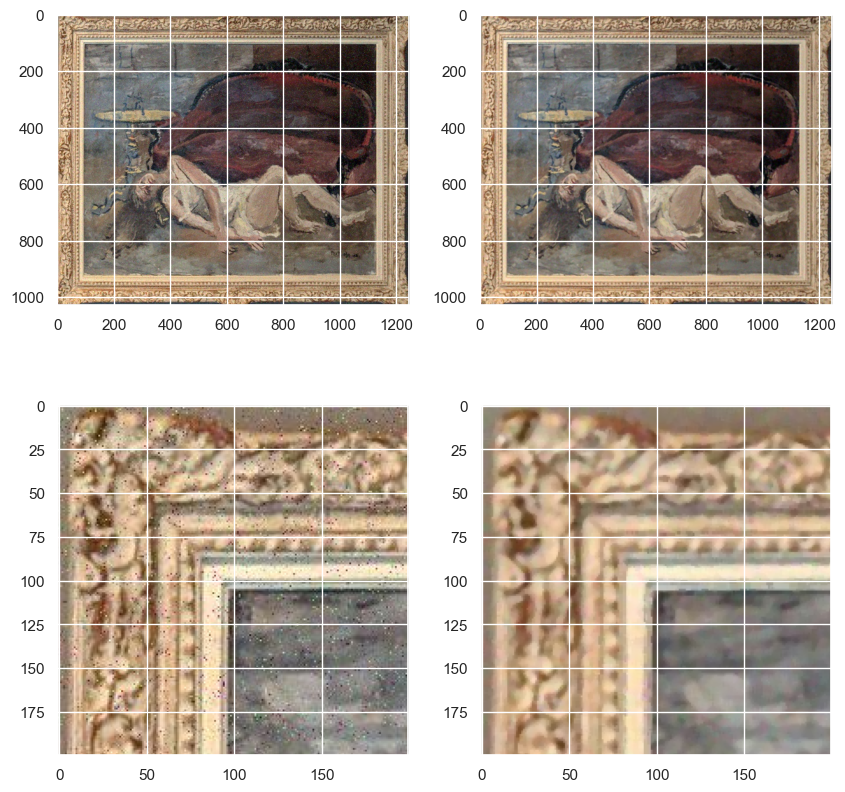

In [36]:
# median filter
noisy_img_ycbcr = ycbcr.convert_img_to_ycbcr(noisy_img)
noisy_img_median_filter_ycbcr = median_filter(noisy_img_ycbcr, size=4, axes=(0,1))
# reconvert to bgr
noisy_img_median_filter = ycbcr.reconvert_img_to_bgr(noisy_img_median_filter_ycbcr)

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)  # left side
ax2 = fig.add_subplot(222)  # right side
display_image(noisy_img, ax1)
display_image(noisy_img_median_filter, ax2)
ax3 = fig.add_subplot(223)  # left side
ax4 = fig.add_subplot(224)  # right side
display_image(noisy_img[:200, :200, :], ax3)
display_image(noisy_img_median_filter[:200, :200, :], ax4)
plt.show()


In [43]:
# grid search to find the best size
results = []
for size in range(1, 10):
    # convert to ycbcr
    noisy_img_ycbcr = ycbcr.convert_img_to_ycbcr(noisy_img)
    noisy_img_median_filter_ycbcr = median_filter(noisy_img_ycbcr, size=size, axes=(0,1))
    # reconvert to bgr
    noisy_img_median_filter = ycbcr.reconvert_img_to_bgr(noisy_img_median_filter_ycbcr)
    
    psne = peak_signal_noise_ratio(noisy_img_gt, noisy_img_median_filter)
    ssim = structural_similarity(noisy_img_gt, noisy_img_median_filter, channel_axis=2)
    results.append({
        "size": size,
        "psne": psne,
        "ssim": ssim
    })

df_median = pd.DataFrame(results)

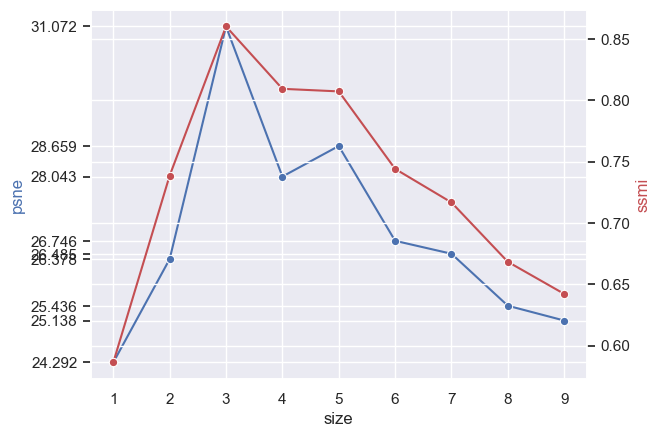

In [44]:
fig, ax1 = plt.subplots() # initializes figure and plots
ax2 = ax1.twinx()

sns.lineplot(df_median[['size','psne']], x='size', y='psne', marker='o', ax=ax1, color='b')
ax1.set(xticks=df_median['size'].values)
ax1.set(yticks=df_median['psne'].values)

sns.lineplot(df_median[['size','ssim']], x='size', y='ssim', marker='o', ax=ax2, color='r')

ax1.set_ylabel('psne', color='b')
ax2.set_ylabel('ssmi', color='r')

plt.xlabel('filter size')
plt.show()

### Grid search with all images

Test performance of the filters without using any noise detector

#### BGR

In [117]:
# apply filters to all images and do grid search to find the best parameters
results_gaussian = []
results_median = []

for image_name in [el for el in os.listdir(data_folder) if el.endswith(".jpg")]:
    input_img = read_image(os.path.join(data_folder, image_name))
    input_img_gt = read_image(os.path.join(gt_data_folder, image_name))

    # gaussian filter
    for sigma in range(10):
        for radius in range(10):
            input_img_gaussian_filter = gaussian_filter(input_img, sigma=sigma, radius=radius, axes=(0,1))
            psne = peak_signal_noise_ratio(input_img_gt, input_img_gaussian_filter)
            ssim = structural_similarity(input_img_gt, input_img_gaussian_filter, channel_axis=2)
            results_gaussian.append({
                "image": image_name,
                "sigma": sigma,
                "radius": radius,
                "psne": psne,
                "ssim": ssim
            })

    # median filter
    for size in range(1, 10):
        input_img_median_filter = median_filter(input_img, size=size, axes=(0,1))
        psne = peak_signal_noise_ratio(input_img_gt, input_img_median_filter)
        ssim = structural_similarity(input_img_gt, input_img_median_filter, channel_axis=2)
        results_median.append({
            "image": image_name,
            "size": size,
            "psne": psne,
            "ssim": ssim
        })

/Users/marina.rosell/Documents/master/C1/Team5/.venv/lib/python3.13/site-packages/skimage/metrics/simple_metrics.py:168: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)


In [49]:
mapping_df = pd.DataFrame(list(zip(sorted([el for el in os.listdir(data_folder) if el.endswith(".jpg")]), augmentations))).rename(columns={0:"image", 1:"augmentation"})

In [ ]:
df_median_all_dataset = pd.DataFrame(results_median)
df_gaussian_all_dataset = pd.DataFrame(results_gaussian)

df_gaussian_all_dataset = df_gaussian_all_dataset.merge(mapping_df)
df_median_all_dataset = df_median_all_dataset.merge(mapping_df)

In [155]:
# Group by sigma and radius, averaging psne and ssim
by_aug = {aug: g.copy() for aug, g in df_gaussian_all_dataset.groupby('augmentation', sort=False)}

# 2) For each, average across images and build pivots
def make_pivots(d: pd.DataFrame):
    avg = (d.groupby(['sigma','radius'], as_index=False)[['psne','ssim']].mean())
    psne_pivot = avg.pivot(index='radius', columns='sigma', values='psne')
    ssim_pivot = avg.pivot(index='radius', columns='sigma', values='ssim')
    return psne_pivot, ssim_pivot

pivots = {aug: make_pivots(d) for aug, d in by_aug.items()}


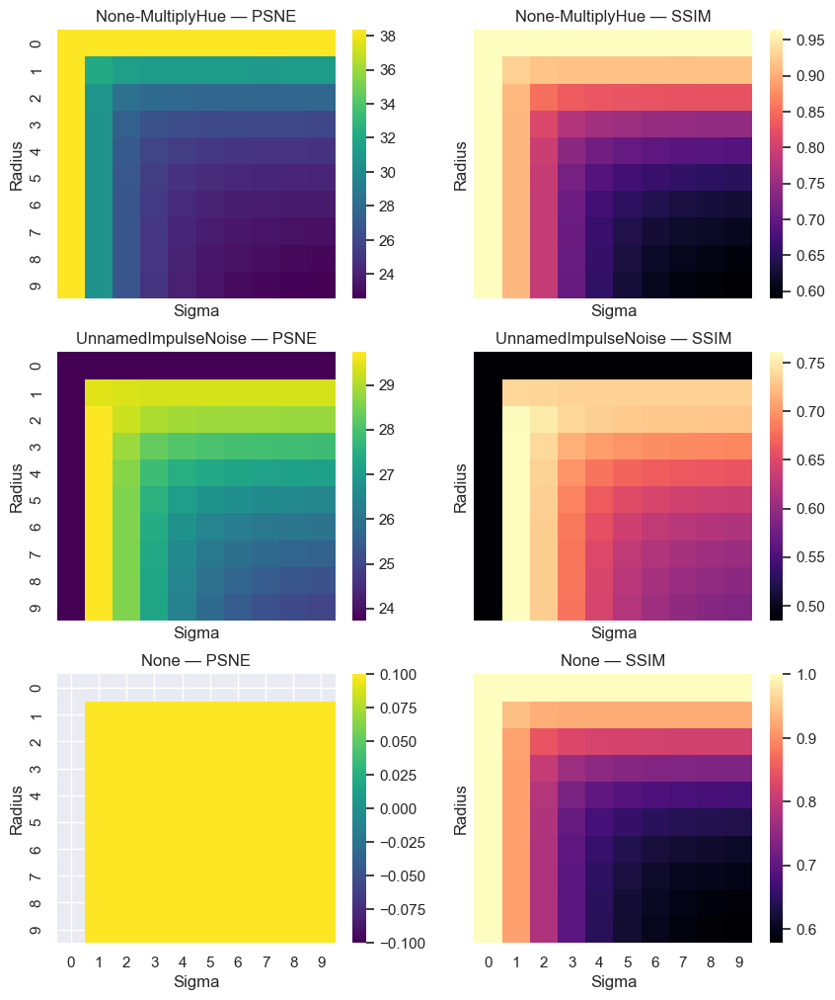

In [157]:
n = len(pivots)
fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(10, 4*n), sharex=True, sharey=True)

if n == 1:  # keep indexing simple when only one augmentation
    axes = [axes]

for r, (aug, (psne_p, ssim_p)) in enumerate(pivots.items()):
    sns.heatmap(psne_p, cmap='viridis', ax=axes[r][0])
    axes[r][0].set_title(f'{aug} — PSNE'); axes[r][0].set_xlabel('Sigma'); axes[r][0].set_ylabel('Radius')

    sns.heatmap(ssim_p, cmap='magma', ax=axes[r][1])
    axes[r][1].set_title(f'{aug} — SSIM'); axes[r][1].set_xlabel('Sigma'); axes[r][1].set_ylabel('Radius')


/Users/marina.rosell/Documents/master/C1/Team5/.venv/lib/python3.13/site-packages/seaborn/relational.py:733: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try lineplot
  warnings.warn(msg, UserWarning)
/Users/marina.rosell/Documents/master/C1/Team5/.venv/lib/python3.13/site-packages/seaborn/relational.py:733: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try lineplot
  warnings.warn(msg, UserWarning)


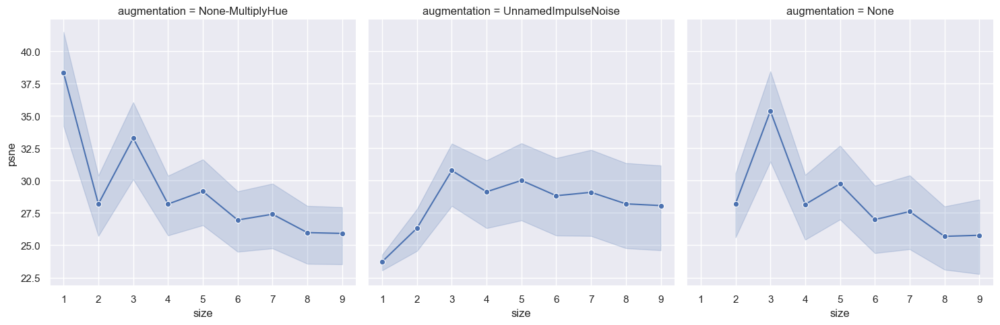

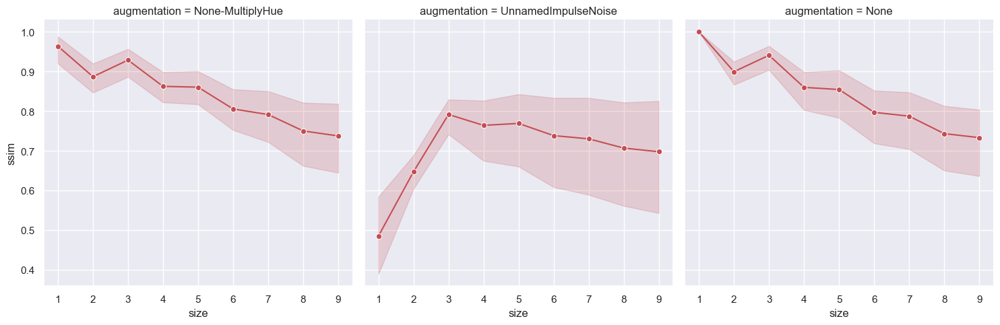

In [ ]:
# mean and 95% ci

sns.relplot(
    data=df_median_all_dataset, x='size', y='psne', marker='o', color='b',
    col="augmentation",
    kind="line"
)
sns.relplot(
    data=df_median_all_dataset, x='size', y='ssim', marker='o', color='r',
    col="augmentation",
    kind="line"
)
plt.show()

#### YCbCr

In [ ]:
# apply filters to all images and do grid search to find the best parameters
results_gaussian = []
results_median = []

for image_name in [el for el in os.listdir(data_folder) if el.endswith(".jpg")]:
    input_img = read_image(os.path.join(data_folder, image_name))
    input_img_gt = read_image(os.path.join(gt_data_folder, image_name))
    
    input_img_ycbcr = ycbcr.convert_img_to_ycbcr(input_img)

    # gaussian filter
    for sigma in range(10):
        for radius in range(10):
            input_img_gaussian_filter_ycbcr = gaussian_filter(input_img_ycbcr, sigma=sigma, radius=radius, axes=(0,1))

            # reconvert to bgr
            input_img_gaussian_filter = ycbcr.reconvert_img_to_bgr(input_img_gaussian_filter_ycbcr)
            
            psne = peak_signal_noise_ratio(input_img_gt, input_img_gaussian_filter)
            ssim = structural_similarity(input_img_gt, input_img_gaussian_filter, channel_axis=2)
            results_gaussian.append({
                "image": image_name,
                "sigma": sigma,
                "radius": radius,
                "psne": psne,
                "ssim": ssim
            })

    # median filter
    for size in range(1, 10):
        input_img_median_filter_ycbcr = median_filter(input_img_ycbcr, size=size, axes=(0,1))

        # reconvert to bgr
        input_img_median_filter = ycbcr.reconvert_img_to_bgr(input_img_median_filter_ycbcr)

        psne = peak_signal_noise_ratio(input_img_gt, input_img_median_filter)
        ssim = structural_similarity(input_img_gt, input_img_median_filter, channel_axis=2)
        results_median.append({
            "image": image_name,
            "size": size,
            "psne": psne,
            "ssim": ssim
        })

### Noise detector

#### with DFT

In [172]:
# Compute DFT per channel
Fshift_noisy = np.zeros_like(noisy_img, dtype=np.complex64)
for c in range(3):
    Fshift_noisy[:,:,c] = fftshift(fft2(noisy_img[:,:,c]))

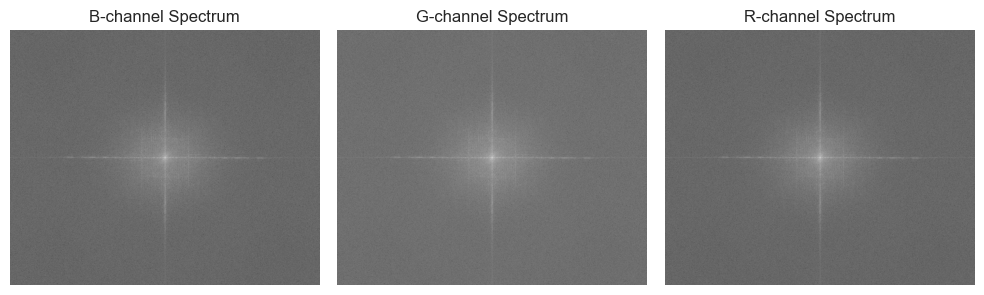

In [173]:

# Visualize magnitude (log scale)
mag_noisy = 20 * np.log10(np.abs(Fshift_noisy) + 1e-12)
#mag_norm = mag / mag.max()  # normalize for display

plt.figure(figsize=(10,4))
for i, color in enumerate(['B','G','R']):
    plt.subplot(1,3,i+1)
    #plt.imshow(mag_norm[:,:,i], cmap='gray')
    plt.imshow(mag_noisy[:,:,i], cmap='gray')
    plt.title(f"{color}-channel Spectrum")
    plt.axis("off")
plt.tight_layout()
plt.show()


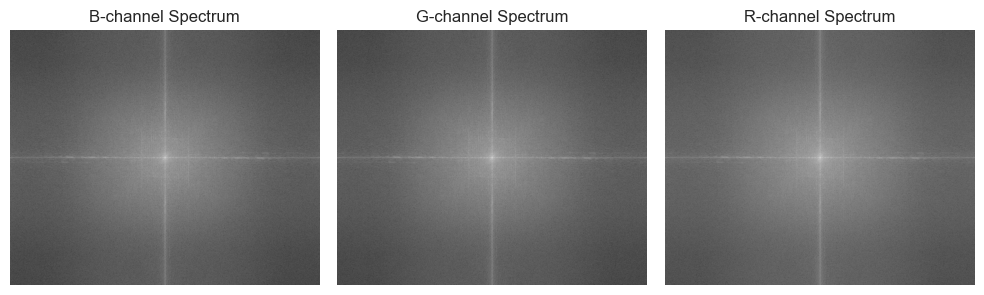

In [174]:
# Compute DFT per channel
Fshift_gt = np.zeros_like(noisy_img_gt, dtype=np.complex64)
for c in range(3):
    Fshift_gt[:,:,c] = fftshift(fft2(noisy_img_gt[:,:,c]))


# Visualize magnitude (log scale)
mag_gt = 20 * np.log10(np.abs(Fshift_gt) + 1e-12)
#mag_norm = mag / mag.max()  # normalize for display


plt.figure(figsize=(10,4))
for i, color in enumerate(['B','G','R']):
    plt.subplot(1,3,i+1)
    plt.imshow(mag_gt[:,:,i], cmap='gray')
    plt.title(f"{color}-channel Spectrum")
    plt.axis("off")
plt.tight_layout()
plt.show()


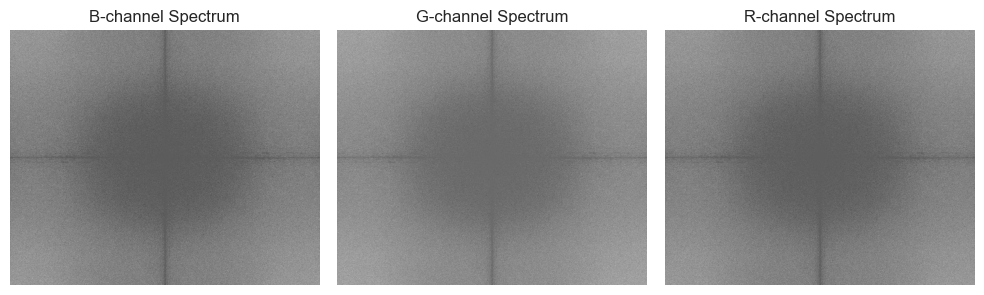

In [176]:
plt.figure(figsize=(10,4))
for i, color in enumerate(['B','G','R']):
    plt.subplot(1,3,i+1)
    plt.imshow(mag_noisy[:,:,i] - mag_gt[:,:,i], cmap='gray')
    plt.title(f"{color}-channel Spectrum")
    plt.axis("off")
plt.tight_layout()
plt.show()

#### with FFT vs 2

In [117]:
import numpy as np
from scipy.fft import fft2, fftshift
from src.descriptors.grayscale import convert_img_to_gray_scale

def estimate_noise_fft(img, threshold=3.5):
    # Convert to grayscale
    gray = convert_img_to_gray_scale(img)
    f = fftshift(fft2(gray))
    magnitude = np.abs(f)
    
    # Split spectrum in low vs high frequencies
    h, w = gray.shape
    center = (h // 2, w // 2)
    r = min(center) // 4  # low-frequency radius
    y, x = np.ogrid[:h, :w]
    mask = (x - center[1])**2 + (y - center[0])**2 <= r**2

    low_energy = magnitude[mask].sum()
    high_energy = magnitude[~mask].sum()
    ratio = high_energy / (low_energy + 1e-8)
    return ratio, ratio > threshold  # True = noisy


In [118]:
noise_classification = []
for image_name in sorted([el for el in os.listdir(data_folder) if el.endswith(".jpg")]):
    input_img = read_image(os.path.join(data_folder, image_name)) 
    threshold, noise_pred = estimate_noise_fft(input_img)
    noise_classification.append({'image': image_name, 'threshold': threshold, 'noise_pred': noise_pred})
noise_pred_df = pd.DataFrame(noise_classification).merge(mapping_df)
noise_pred_df['noise_gt'] = noise_pred_df['augmentation'].apply(lambda x: True if x=='UnnamedImpulseNoise' else False)
noise_pred_df

,image,threshold,noise_pred,augmentation,noise_gt
0,00000.jpg,1.952772,False,None-MultiplyHue,False
1,00001.jpg,1.363036,False,None,False
2,00002.jpg,3.001341,False,None-MultiplyHue,False
3,00003.jpg,1.308868,False,None-MultiplyHue,False
4,00004.jpg,1.557287,False,None,False
5,00005.jpg,3.966385,True,UnnamedImpulseNoise,True
6,00006.jpg,6.587259,True,UnnamedImpulseNoise,True
7,00007.jpg,1.015970,False,None-MultiplyHue,False
8,00008.jpg,1.230677,False,None,False
9,00009.jpg,1.729036,False,None-MultiplyHue,False


In [119]:
confusion_matrix(noise_pred_df['noise_gt'], noise_pred_df['noise_pred'])

array([[21,  2],
       [ 0,  7]])

#### with Wavelet Transform

In [136]:
import pywt
import numpy as np

def estimate_noise_wavelet(img, threshold=5):
    gray = np.mean(img, axis=2) if img.ndim == 3 else img
    coeffs = pywt.dwt2(gray, 'db1')
    cA, (cH, cV, cD) = coeffs
    # Use diagonal detail coefficients
    sigma = np.median(np.abs(cD)) / 0.6745  # estimated noise std
    return sigma, sigma > threshold  # True = noisy


In [137]:
noise_classification = []
for image_name in sorted([el for el in os.listdir(data_folder) if el.endswith(".jpg")]):
    input_img = read_image(os.path.join(data_folder, image_name)) 
    threshold, noise_pred = estimate_noise_wavelet(input_img)
    noise_classification.append({'image': image_name, 'threshold': threshold, 'noise_pred': noise_pred})
noise_pred_df = pd.DataFrame(noise_classification).merge(mapping_df)
noise_pred_df['noise_gt'] = noise_pred_df['augmentation'].apply(lambda x: True if x=='UnnamedImpulseNoise' else False)
noise_pred_df

,image,threshold,noise_pred,augmentation,noise_gt
0,00000.jpg,4.941932e-01,False,None-MultiplyHue,False
1,00001.jpg,7.412898e-01,False,None,False
2,00002.jpg,2.211398e-15,False,None-MultiplyHue,False
3,00003.jpg,1.482580e+00,False,None-MultiplyHue,False
4,00004.jpg,7.412898e-01,False,None,False
5,00005.jpg,8.154188e+00,True,UnnamedImpulseNoise,True
6,00006.jpg,1.531999e+01,True,UnnamedImpulseNoise,True
7,00007.jpg,2.470966e-01,False,None-MultiplyHue,False
8,00008.jpg,2.470966e-01,False,None,False
9,00009.jpg,1.729676e+00,False,None-MultiplyHue,False


In [138]:
confusion_matrix(noise_pred_df['noise_gt'], noise_pred_df['noise_pred'])

array([[22,  1],
       [ 0,  7]])

#### with gradients

In [59]:
from src.descriptors.grayscale import convert_img_to_gray_scale

In [60]:
noisy_img_gray = convert_img_to_gray_scale(noisy_img)
noisy_img_gt_gray = convert_img_to_gray_scale(noisy_img_gt)

In [61]:
noisy_img_gray

array([[136, 140, 116, ...,  83,  75, 112],
       [145, 134, 157, ...,  75,  81,  72],
       [139, 138, 197, ...,  63,  88,  84],
       ...,
       [127, 109, 103, ...,  78,  62,   2],
       [123, 117, 104, ...,  78,  68,   1],
       [  6,  12,   2, ...,  70,  69,   1]],
      shape=(1028, 1248), dtype=uint8)

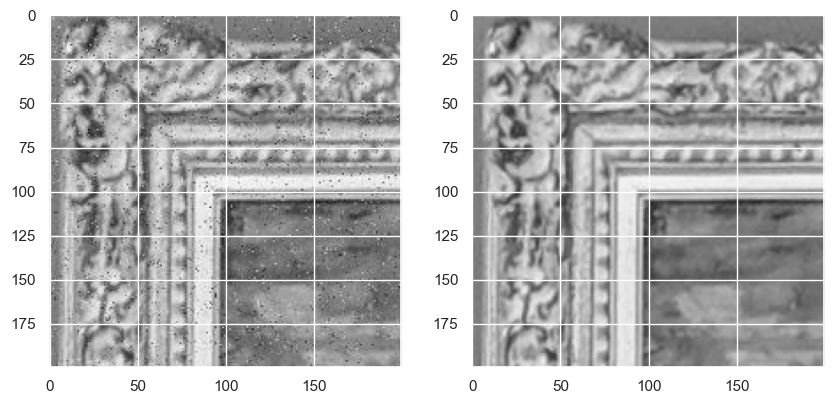

In [62]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # right side
display_image(noisy_img_gray[:200,:200], ax1)
display_image(noisy_img_gt_gray[:200,:200], ax2)
plt.show()

In [239]:
noisy_img_gray = noisy_img_gray.astype(np.int32)
noisy_img_gt_gray = noisy_img_gt_gray.astype(np.int32)

In [240]:
# compute gradient of an image
grad_i_noisy_img_gray = noisy_img_gray[1:, :] - noisy_img_gray[:-1, :]
grad_j_noisy_img_gray = noisy_img_gray[:, 1:] - noisy_img_gray[:, :-1]
grad_2i_noisy_img_gray = noisy_img_gray[2:, :] - noisy_img_gray[:-2, :]
grad_2j_noisy_img_gray = noisy_img_gray[:, 2:] - noisy_img_gray[:, :-2]

In [241]:
# difference among consecutive values of gradients
diff_1_grad_noisy_i = grad_i_noisy_img_gray[1:, :] - grad_i_noisy_img_gray[:-1, :]
diff_1_grad_noisy_j = grad_j_noisy_img_gray[1:, :] - grad_j_noisy_img_gray[:-1, :]

diff_1_grad_noisy = np.abs(np.concat((diff_1_grad_noisy_i.ravel(), diff_1_grad_noisy_j.ravel())))

In [242]:
print(diff_1_grad_noisy.min(), np.quantile(diff_1_grad_noisy, .25), np.quantile(diff_1_grad_noisy, .5), np.quantile(diff_1_grad_noisy, .75), diff_1_grad_noisy.max())

0 4.0 11.0 25.0 419


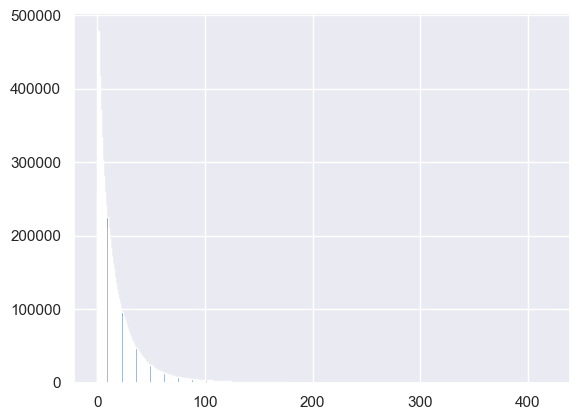

In [243]:
diff_1_grad_noisy_hist = np.histogram(diff_1_grad_noisy,
             bins=diff_1_grad_noisy.max() - diff_1_grad_noisy.min(),
             range=[diff_1_grad_noisy.min(), diff_1_grad_noisy.max()])

display_histogram(*diff_1_grad_noisy_hist)

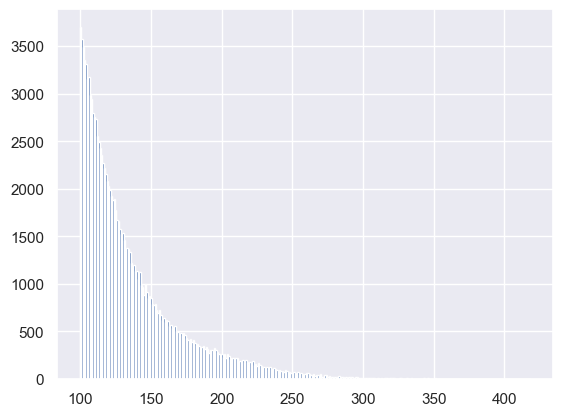

In [245]:
diff_1_grad_noisy_hist = np.histogram(diff_1_grad_noisy,
             bins=diff_1_grad_noisy.max() - diff_1_grad_noisy.min()-100,
             range=[diff_1_grad_noisy.min()+100, diff_1_grad_noisy.max()])

display_histogram(*diff_1_grad_noisy_hist)

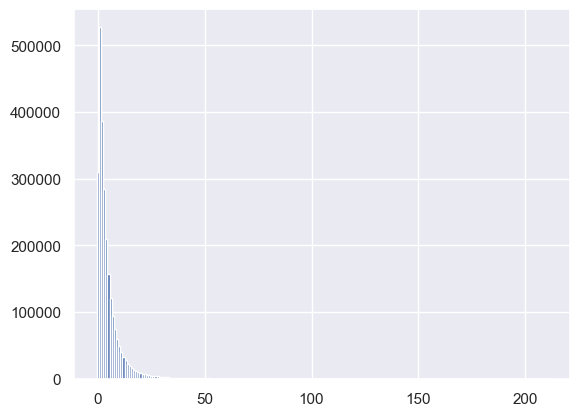

In [72]:
# compute gradient of an image
grad_i_noisy_img_gt_gray = noisy_img_gt_gray[1:, :] - noisy_img_gt_gray[:-1, :]
grad_j_noisy_img_gt_gray = noisy_img_gt_gray[:, 1:] - noisy_img_gt_gray[:, :-1]
grad_2i_noisy_img_gt_gray = noisy_img_gt_gray[2:, :] - noisy_img_gt_gray[:-2, :]
grad_2j_noisy_img_gt_gray = noisy_img_gt_gray[:, 2:] - noisy_img_gt_gray[:, :-2]

# difference among consecutive values of gradients
diff_1_grad_noisy_gt_i = grad_i_noisy_img_gt_gray[1:, :] - grad_i_noisy_img_gt_gray[:-1, :]
diff_1_grad_noisy_gt_j = grad_j_noisy_img_gt_gray[1:, :] - grad_j_noisy_img_gt_gray[:-1, :]

diff_1_grad_noisy_gt = np.abs(np.concat((diff_1_grad_noisy_gt_i.ravel(), diff_1_grad_noisy_gt_j.ravel())))

diff_1_grad_noisy_gt_hist = np.histogram(diff_1_grad_noisy_gt.ravel(),
             bins=diff_1_grad_noisy_gt.max() - diff_1_grad_noisy_gt.min(),
             range=[diff_1_grad_noisy_gt.min(), diff_1_grad_noisy_gt.max()])

display_histogram(*diff_1_grad_noisy_gt_hist)

In [73]:
print(diff_1_grad_noisy_gt.min(), np.quantile(diff_1_grad_noisy_gt, .25), np.quantile(diff_1_grad_noisy_gt, .5), np.quantile(diff_1_grad_noisy_gt, .75), diff_1_grad_noisy_gt.max())

0 1.0 3.0 6.0 211


#### noise detector with gradients over all dataset

In [74]:
list(mapping_df[mapping_df['augmentation']=='UnnamedImpulseNoise']['image'])

['00005.jpg',
 '00006.jpg',
 '00016.jpg',
 '00018.jpg',
 '00020.jpg',
 '00023.jpg',
 '00029.jpg']

##### GRAYSCALE

In [75]:
# apply filters to all images and do grid search to find the best parameters
diff_1_grad_noisy_gt = []
diff_1_grad_noisy = []
diff_2_grad_noisy_gt = []
diff_2_grad_noisy = []

for image_name in sorted([el for el in os.listdir(data_folder) if el.endswith(".jpg") 
                   and (el in list(mapping_df[mapping_df['augmentation']=='UnnamedImpulseNoise']['image']))]):
    # read images
    input_img = read_image(os.path.join(data_folder, image_name))
    input_img_gt = read_image(os.path.join(gt_data_folder, image_name))

    # convert to grayscale
    noisy_img_gray = convert_img_to_gray_scale(input_img)
    noisy_img_gt_gray = convert_img_to_gray_scale(input_img_gt)

    # convert to integers 32 bits to be able to represent the differences
    noisy_img_gray = noisy_img_gray.astype(np.int32)
    noisy_img_gt_gray = noisy_img_gt_gray.astype(np.int32)

    # compute gradient of the noisy images
    grad_i_noisy_img_gray = noisy_img_gray[1:, :] - noisy_img_gray[:-1, :]
    grad_j_noisy_img_gray = noisy_img_gray[:, 1:] - noisy_img_gray[:, :-1]
    grad_2i_noisy_img_gray = noisy_img_gray[2:, :] - noisy_img_gray[:-2, :]
    grad_2j_noisy_img_gray = noisy_img_gray[:, 2:] - noisy_img_gray[:, :-2]

    # compute gradient of the gt images
    grad_i_noisy_img_gt_gray = noisy_img_gt_gray[1:, :] - noisy_img_gt_gray[:-1, :]
    grad_j_noisy_img_gt_gray = noisy_img_gt_gray[:, 1:] - noisy_img_gt_gray[:, :-1]
    grad_2i_noisy_img_gt_gray = noisy_img_gt_gray[2:, :] - noisy_img_gt_gray[:-2, :]
    grad_2j_noisy_img_gt_gray = noisy_img_gt_gray[:, 2:] - noisy_img_gt_gray[:, :-2]

    # difference among consecutive values of gradients
    diff_1_grad_noisy_i = grad_i_noisy_img_gray[1:, :] - grad_i_noisy_img_gray[:-1, :]
    diff_1_grad_noisy_j = grad_j_noisy_img_gray[1:, :] - grad_j_noisy_img_gray[:-1, :]

    # difference among values of 1st and 2nd gradients
    diff_2_grad_noisy_i = grad_i_noisy_img_gray[:-1, :] - grad_2i_noisy_img_gray
    diff_2_grad_noisy_j = grad_j_noisy_img_gray[:, :-1] - grad_2j_noisy_img_gray

    # difference among consecutive values of gradients gt
    diff_1_grad_noisy_i_gt = grad_i_noisy_img_gt_gray[1:, :] - grad_i_noisy_img_gt_gray[:-1, :]
    diff_1_grad_noisy_j_gt = grad_j_noisy_img_gt_gray[1:, :] - grad_j_noisy_img_gt_gray[:-1, :]

    # difference among values of 1st and 2nd gradients gt
    diff_2_grad_noisy_i_gt = grad_i_noisy_img_gt_gray[:-1, :] - grad_2i_noisy_img_gt_gray
    diff_2_grad_noisy_j_gt = grad_j_noisy_img_gt_gray[:, :-1] - grad_2j_noisy_img_gt_gray

    # flatten and cocat i and j gradients
    diff_1_grad_noisy.append(np.abs(np.concat((diff_1_grad_noisy_i.ravel(), diff_1_grad_noisy_j.ravel()))))
    diff_1_grad_noisy_gt.append(np.abs(np.concat((diff_1_grad_noisy_i_gt.ravel(), diff_1_grad_noisy_j_gt.ravel()))))

    # flatten and cocat i and j gradients gt
    diff_2_grad_noisy.append(np.abs(np.concat((diff_2_grad_noisy_i.ravel(), diff_2_grad_noisy_j.ravel()))))
    diff_2_grad_noisy_gt.append(np.abs(np.concat((diff_2_grad_noisy_i_gt.ravel(), diff_2_grad_noisy_j_gt.ravel()))))


In [76]:
len(diff_1_grad_noisy_gt)

7

In [77]:
for el in diff_1_grad_noisy:
    print(el.min(), np.quantile(el, .25), np.quantile(el, .5), np.quantile(el, .75), el.max())

0 5.0 13.0 27.0 425
0 10.0 24.0 46.0 386
0 5.0 13.0 28.0 461
0 4.0 11.0 25.0 390
0 5.0 14.0 29.0 410
0 6.0 14.0 31.0 467
0 4.0 11.0 25.0 419


In [78]:
for el in diff_1_grad_noisy_gt:
    print(el.min(), np.quantile(el, .25), np.quantile(el, .5), np.quantile(el, .75), el.max())

0 1.0 3.0 6.0 211
0 5.0 15.0 31.0 272
0 1.0 2.0 4.0 111
0 0.0 0.0 1.0 63
0 1.0 2.0 5.0 260
0 0.0 1.0 2.0 157
0 0.0 1.0 2.0 213


In [79]:
for el in diff_2_grad_noisy:
    print(el.min(), np.quantile(el, .25), np.quantile(el, .5), np.quantile(el, .75), el.max())

0 4.0 10.0 19.0 222
0 8.0 17.0 32.0 221
0 4.0 9.0 17.0 233
0 3.0 7.0 16.0 206
0 4.0 9.0 19.0 214
0 4.0 9.0 18.0 243
0 3.0 8.0 16.0 242


In [80]:
for el in diff_2_grad_noisy_gt:
    print(el.min(), np.quantile(el, .25), np.quantile(el, .5), np.quantile(el, .75), el.max())

0 1.0 3.0 7.0 188
0 5.0 13.0 25.0 170
0 1.0 3.0 5.0 101
0 0.0 1.0 1.0 92
0 1.0 2.0 6.0 144
0 0.0 1.0 3.0 151
0 1.0 1.0 3.0 253


##### RGB

In [81]:
# apply filters to all images and do grid search to find the best parameters
diff_1_grad_noisy_gt_bgr = [[],[],[]]
diff_1_grad_noisy_bgr = [[],[],[]]
diff_2_grad_noisy_gt_bgr = [[],[],[]]
diff_2_grad_noisy_bgr = [[],[],[]]

for image_name in sorted([el for el in os.listdir(data_folder) if el.endswith(".jpg") 
                   and (el in list(mapping_df[mapping_df['augmentation']=='UnnamedImpulseNoise']['image']))]):
    # read images
    input_img = read_image(os.path.join(data_folder, image_name))
    input_img_gt = read_image(os.path.join(gt_data_folder, image_name))

    for channel in range(3):

        # convert to integers 32 bits to be able to represent the differences
        noisy_img_bgr_c = input_img[:,:,channel].astype(np.int32)
        noisy_img_gt_bgr_c = input_img_gt[:,:,channel].astype(np.int32)

        # compute gradient of the noisy images
        grad_i_noisy_img_bgr_c = noisy_img_bgr_c[1:, :] - noisy_img_bgr_c[:-1, :]
        grad_j_noisy_img_bgr_c = noisy_img_bgr_c[:, 1:] - noisy_img_bgr_c[:, :-1]
        grad_2i_noisy_img_bgr_c = noisy_img_bgr_c[2:, :] - noisy_img_bgr_c[:-2, :]
        grad_2j_noisy_img_bgr_c = noisy_img_bgr_c[:, 2:] - noisy_img_bgr_c[:, :-2]

        # compute gradient of the gt images
        grad_i_noisy_img_gt_bgr_c = noisy_img_gt_bgr_c[1:, :] - noisy_img_gt_bgr_c[:-1, :]
        grad_j_noisy_img_gt_bgr_c = noisy_img_gt_bgr_c[:, 1:] - noisy_img_gt_bgr_c[:, :-1]
        grad_2i_noisy_img_gt_bgr_c = noisy_img_gt_bgr_c[2:, :] - noisy_img_gt_bgr_c[:-2, :]
        grad_2j_noisy_img_gt_bgr_c = noisy_img_gt_bgr_c[:, 2:] - noisy_img_gt_bgr_c[:, :-2]

        # difference among consecutive values of gradients
        diff_1_grad_noisy_i = grad_i_noisy_img_bgr_c[1:, :] - grad_i_noisy_img_bgr_c[:-1, :]
        diff_1_grad_noisy_j = grad_j_noisy_img_bgr_c[1:, :] - grad_j_noisy_img_bgr_c[:-1, :]

        # difference among values of 1st and 2nd gradients
        diff_2_grad_noisy_i = grad_i_noisy_img_bgr_c[:-1, :] - grad_2i_noisy_img_bgr_c
        diff_2_grad_noisy_j = grad_j_noisy_img_bgr_c[:, :-1] - grad_2j_noisy_img_bgr_c

        # difference among consecutive values of gradients gt
        diff_1_grad_noisy_i_gt = grad_i_noisy_img_gt_bgr_c[1:, :] - grad_i_noisy_img_gt_bgr_c[:-1, :]
        diff_1_grad_noisy_j_gt = grad_j_noisy_img_gt_bgr_c[1:, :] - grad_j_noisy_img_gt_bgr_c[:-1, :]

        # difference among values of 1st and 2nd gradients gt
        diff_2_grad_noisy_i_gt = grad_i_noisy_img_gt_bgr_c[:-1, :] - grad_2i_noisy_img_gt_bgr_c
        diff_2_grad_noisy_j_gt = grad_j_noisy_img_gt_bgr_c[:, :-1] - grad_2j_noisy_img_gt_bgr_c

        # flatten and cocat i and j gradients
        diff_1_grad_noisy_bgr[channel].append(np.abs(np.concat((diff_1_grad_noisy_i.ravel(), diff_1_grad_noisy_j.ravel()))))
        diff_1_grad_noisy_gt_bgr[channel].append(np.abs(np.concat((diff_1_grad_noisy_i_gt.ravel(), diff_1_grad_noisy_j_gt.ravel()))))

        # flatten and cocat i and j gradients gt
        diff_2_grad_noisy_bgr[channel].append(np.abs(np.concat((diff_2_grad_noisy_i.ravel(), diff_2_grad_noisy_j.ravel()))))
        diff_2_grad_noisy_gt_bgr[channel].append(np.abs(np.concat((diff_2_grad_noisy_i_gt.ravel(), diff_2_grad_noisy_j_gt.ravel()))))


In [82]:
for channel in range(3):
    print("channel:", channel)
    for el in diff_1_grad_noisy_bgr[channel]:
        print(el.min(), np.quantile(el, .25), np.quantile(el, .5), np.quantile(el, .75), el.max())

channel: 0
0 5.0 13.0 27.0 414
0 10.0 24.0 46.0 375
0 5.0 13.0 27.0 460
0 4.0 11.0 25.0 390
0 5.0 14.0 29.0 402
0 5.0 14.0 29.0 467
0 4.0 12.0 25.0 414
channel: 1
0 5.0 13.0 27.0 430
0 10.0 24.0 46.0 387
0 5.0 13.0 28.0 460
0 4.0 11.0 25.0 391
0 5.0 14.0 29.0 409
0 6.0 14.0 31.0 471
0 4.0 12.0 25.0 433
channel: 2
0 5.0 13.0 27.0 427
0 10.0 24.0 46.0 386
0 5.0 13.0 28.0 463
0 4.0 11.0 25.0 389
0 5.0 14.0 29.0 412
0 6.0 15.0 31.0 459
0 4.0 11.0 25.0 424


In [83]:
for channel in range(3):
    print("channel:", channel)
    for el in diff_1_grad_noisy_gt_bgr[channel]:
        print(el.min(), np.quantile(el, .25), np.quantile(el, .5), np.quantile(el, .75), el.max())

channel: 0
0 1.0 3.0 6.0 206
0 5.0 15.0 31.0 274
0 1.0 2.0 4.0 107
0 0.0 1.0 1.0 63
0 1.0 2.0 5.0 228
0 0.0 1.0 3.0 157
0 0.0 1.0 3.0 212
channel: 1
0 1.0 3.0 6.0 214
0 5.0 15.0 31.0 274
0 1.0 2.0 4.0 113
0 0.0 0.0 1.0 63
0 1.0 2.0 5.0 264
0 0.0 1.0 3.0 157
0 0.0 1.0 3.0 215
channel: 2
0 1.0 3.0 6.0 207
0 5.0 15.0 31.0 264
0 1.0 2.0 4.0 114
0 0.0 0.0 1.0 62
0 1.0 2.0 5.0 265
0 0.0 1.0 3.0 157
0 0.0 1.0 3.0 211


##### YCbCr

In [84]:
# apply filters to all images and do grid search to find the best parameters
diff_1_grad_noisy_gt_ycbcr = [[],[],[]]
diff_1_grad_noisy_ycbcr = [[],[],[]]
diff_2_grad_noisy_gt_ycbcr = [[],[],[]]
diff_2_grad_noisy_ycbcr = [[],[],[]]

for image_name in sorted([el for el in os.listdir(data_folder) if el.endswith(".jpg") 
                   and (el in list(mapping_df[mapping_df['augmentation']=='UnnamedImpulseNoise']['image']))]):
    # read images
    input_img = read_image(os.path.join(data_folder, image_name))
    input_img_gt = read_image(os.path.join(gt_data_folder, image_name))

    noisy_img_ycbcr = ycbcr.convert_img_to_ycbcr(input_img)
    noisy_img_gt_ycbcr = ycbcr.convert_img_to_ycbcr(input_img_gt)

    for channel in range(3):

        # convert to integers 32 bits to be able to represent the differences
        noisy_img_ycbcr_c = noisy_img_ycbcr[:,:,channel].astype(np.int32)
        noisy_img_gt_ycbcr_c = noisy_img_gt_ycbcr[:,:,channel].astype(np.int32)

        # compute gradient of the noisy images
        grad_i_noisy_img_ycbcr_c = noisy_img_ycbcr_c[1:, :] - noisy_img_ycbcr_c[:-1, :]
        grad_j_noisy_img_ycbcr_c = noisy_img_ycbcr_c[:, 1:] - noisy_img_ycbcr_c[:, :-1]
        grad_2i_noisy_img_ycbcr_c = noisy_img_ycbcr_c[2:, :] - noisy_img_ycbcr_c[:-2, :]
        grad_2j_noisy_img_ycbcr_c = noisy_img_ycbcr_c[:, 2:] - noisy_img_ycbcr_c[:, :-2]

        # compute gradient of the gt images
        grad_i_noisy_img_gt_ycbcr_c = noisy_img_gt_ycbcr_c[1:, :] - noisy_img_gt_ycbcr_c[:-1, :]
        grad_j_noisy_img_gt_ycbcr_c = noisy_img_gt_ycbcr_c[:, 1:] - noisy_img_gt_ycbcr_c[:, :-1]
        grad_2i_noisy_img_gt_ycbcr_c = noisy_img_gt_ycbcr_c[2:, :] - noisy_img_gt_ycbcr_c[:-2, :]
        grad_2j_noisy_img_gt_ycbcr_c = noisy_img_gt_ycbcr_c[:, 2:] - noisy_img_gt_ycbcr_c[:, :-2]

        # difference among consecutive values of gradients
        diff_1_grad_noisy_i = grad_i_noisy_img_ycbcr_c[1:, :] - grad_i_noisy_img_ycbcr_c[:-1, :]
        diff_1_grad_noisy_j = grad_j_noisy_img_ycbcr_c[1:, :] - grad_j_noisy_img_ycbcr_c[:-1, :]

        # difference among values of 1st and 2nd gradients
        diff_2_grad_noisy_i = grad_i_noisy_img_ycbcr_c[:-1, :] - grad_2i_noisy_img_ycbcr_c
        diff_2_grad_noisy_j = grad_j_noisy_img_ycbcr_c[:, :-1] - grad_2j_noisy_img_ycbcr_c

        # difference among consecutive values of gradients gt
        diff_1_grad_noisy_i_gt = grad_i_noisy_img_gt_ycbcr_c[1:, :] - grad_i_noisy_img_gt_ycbcr_c[:-1, :]
        diff_1_grad_noisy_j_gt = grad_j_noisy_img_gt_ycbcr_c[1:, :] - grad_j_noisy_img_gt_ycbcr_c[:-1, :]

        # difference among values of 1st and 2nd gradients gt
        diff_2_grad_noisy_i_gt = grad_i_noisy_img_gt_ycbcr_c[:-1, :] - grad_2i_noisy_img_gt_ycbcr_c
        diff_2_grad_noisy_j_gt = grad_j_noisy_img_gt_ycbcr_c[:, :-1] - grad_2j_noisy_img_gt_ycbcr_c

        # flatten and cocat i and j gradients
        diff_1_grad_noisy_ycbcr[channel].append(np.abs(np.concat((diff_1_grad_noisy_i.ravel(), diff_1_grad_noisy_j.ravel()))))
        diff_1_grad_noisy_gt_ycbcr[channel].append(np.abs(np.concat((diff_1_grad_noisy_i_gt.ravel(), diff_1_grad_noisy_j_gt.ravel()))))

        # flatten and cocat i and j gradients gt
        diff_2_grad_noisy_ycbcr[channel].append(np.abs(np.concat((diff_2_grad_noisy_i.ravel(), diff_2_grad_noisy_j.ravel()))))
        diff_2_grad_noisy_gt_ycbcr[channel].append(np.abs(np.concat((diff_2_grad_noisy_i_gt.ravel(), diff_2_grad_noisy_j_gt.ravel()))))


In [85]:
for channel in range(3):
    print("channel:", channel)
    for el in diff_1_grad_noisy_ycbcr[channel]:
        print(el.min(), np.quantile(el, .05), np.quantile(el, .1), np.quantile(el, .25), np.quantile(el, .5), np.quantile(el, .75), el.max())

channel: 0
0 1.0 2.0 5.0 13.0 27.0 425
0 2.0 4.0 10.0 24.0 46.0 386
0 1.0 2.0 5.0 13.0 28.0 461
0 1.0 1.0 4.0 11.0 25.0 390
0 1.0 2.0 5.0 14.0 29.0 410
0 1.0 2.0 6.0 14.0 31.0 467
0 1.0 1.0 4.0 11.0 25.0 419
channel: 1
0 0.0 0.0 0.0 0.0 1.0 35
0 0.0 0.0 0.0 0.0 1.0 39
0 0.0 0.0 0.0 1.0 1.0 41
0 0.0 0.0 0.0 0.0 1.0 18
0 0.0 0.0 0.0 0.0 1.0 19
0 0.0 0.0 0.0 1.0 2.0 88
0 0.0 0.0 0.0 0.0 1.0 49
channel: 2
0 0.0 0.0 0.0 0.0 1.0 44
0 0.0 0.0 0.0 0.0 1.0 31
0 0.0 0.0 0.0 1.0 1.0 55
0 0.0 0.0 0.0 0.0 1.0 24
0 0.0 0.0 0.0 0.0 1.0 29
0 0.0 0.0 0.0 1.0 2.0 52
0 0.0 0.0 0.0 0.0 1.0 81


In [86]:
for channel in range(3):
    print("channel:", channel)
    for el in diff_1_grad_noisy_gt_ycbcr[channel]:
        print(el.min(), np.quantile(el, .05), np.quantile(el, .1), np.quantile(el, .25), np.quantile(el, .5), np.quantile(el, .75), el.max())

channel: 0
0 0.0 0.0 1.0 3.0 6.0 211
0 1.0 2.0 5.0 15.0 31.0 272
0 0.0 0.0 1.0 2.0 4.0 111
0 0.0 0.0 0.0 0.0 1.0 63
0 0.0 0.0 1.0 2.0 5.0 260
0 0.0 0.0 0.0 1.0 2.0 157
0 0.0 0.0 0.0 1.0 2.0 213
channel: 1
0 0.0 0.0 0.0 0.0 0.0 30
0 0.0 0.0 0.0 0.0 0.0 9
0 0.0 0.0 0.0 0.0 0.0 6
0 0.0 0.0 0.0 0.0 0.0 3
0 0.0 0.0 0.0 0.0 0.0 7
0 0.0 0.0 0.0 0.0 1.0 20
0 0.0 0.0 0.0 0.0 0.0 23
channel: 2
0 0.0 0.0 0.0 0.0 0.0 9
0 0.0 0.0 0.0 0.0 0.0 12
0 0.0 0.0 0.0 0.0 0.0 16
0 0.0 0.0 0.0 0.0 0.0 6
0 0.0 0.0 0.0 0.0 0.0 23
0 0.0 0.0 0.0 0.0 0.0 20
0 0.0 0.0 0.0 0.0 0.0 9


In [87]:
import numpy as np
import scipy.stats

def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

In [88]:
for img in diff_1_grad_noisy_ycbcr[0]:
    print(mean_confidence_interval(img))

(np.float64(21.182327086189346), np.float64(21.150664065634505), np.float64(21.213990106744188))
(np.float64(33.463339721135554), np.float64(33.387940553769596), np.float64(33.53873888850151))
(np.float64(22.13541581312234), np.float64(22.075024883585485), np.float64(22.195806742659194))
(np.float64(19.48572613832062), np.float64(19.43104697017347), np.float64(19.54040530646777))
(np.float64(22.56403415502834), np.float64(22.424396368138986), np.float64(22.703671941917698))
(np.float64(25.370283690829908), np.float64(25.28944874421834), np.float64(25.451118637441475))
(np.float64(19.52273517740829), np.float64(19.504706434658292), np.float64(19.540763920158287))


In [89]:
for img in diff_1_grad_noisy_gt_ycbcr[0]:
    print(mean_confidence_interval(img))

(np.float64(4.790361393095278), np.float64(4.782248979839098), np.float64(4.798473806351458))
(np.float64(22.100204994175826), np.float64(22.045832079893106), np.float64(22.154577908458545))
(np.float64(3.3620423552547836), np.float64(3.353439712551386), np.float64(3.370644997958181))
(np.float64(0.9287223998256928), np.float64(0.9246849397805115), np.float64(0.9327598598708742))
(np.float64(4.95877391536911), np.float64(4.909724585583861), np.float64(5.007823245154359))
(np.float64(2.549533965566364), np.float64(2.5355213016681795), np.float64(2.5635466294645486))
(np.float64(2.2281310886131065), np.float64(2.2252442955295946), np.float64(2.2310178816966184))


In [90]:
# apply filters to all images and do grid search to find the best parameters
diff_1_grad_clear_ycbcr = [[],[],[]]

for image_name in sorted([el for el in os.listdir(gt_data_folder) if el.endswith(".jpg")]):
    # read images
    input_img = read_image(os.path.join(gt_data_folder, image_name))
    clear_img_ycbcr = ycbcr.convert_img_to_ycbcr(input_img)

    for channel in range(3):

        # convert to integers 32 bits to be able to represent the differences
        clear_img_ycbcr_c = clear_img_ycbcr[:,:,channel].astype(np.int32)

        # compute gradient of the clear images
        grad_i_clear_img_ycbcr_c = clear_img_ycbcr_c[1:, :] - clear_img_ycbcr_c[:-1, :]
        grad_j_clear_img_ycbcr_c = clear_img_ycbcr_c[:, 1:] - clear_img_ycbcr_c[:, :-1]
        grad_2i_clear_img_ycbcr_c = clear_img_ycbcr_c[2:, :] - clear_img_ycbcr_c[:-2, :]
        grad_2j_clear_img_ycbcr_c = clear_img_ycbcr_c[:, 2:] - clear_img_ycbcr_c[:, :-2]

        # difference among consecutive values of gradients
        diff_1_grad_clear_i = grad_i_clear_img_ycbcr_c[1:, :] - grad_i_clear_img_ycbcr_c[:-1, :]
        diff_1_grad_clear_j = grad_j_clear_img_ycbcr_c[1:, :] - grad_j_clear_img_ycbcr_c[:-1, :]

        # difference among values of 1st and 2nd gradients
        diff_2_grad_clear_i = grad_i_clear_img_ycbcr_c[:-1, :] - grad_2i_clear_img_ycbcr_c
        diff_2_grad_clear_j = grad_j_clear_img_ycbcr_c[:, :-1] - grad_2j_clear_img_ycbcr_c

        # flatten and cocat i and j gradients
        diff_1_grad_clear_ycbcr[channel].append(np.abs(np.concat((diff_1_grad_clear_i.ravel(), diff_1_grad_clear_j.ravel()))))


In [91]:
for channel in range(3):
    print("channel:", channel)
    for el in diff_1_grad_clear_ycbcr[channel]:
        print(el.min(), np.quantile(el, .05), np.quantile(el, .1), np.quantile(el, .25), np.quantile(el, .5), np.quantile(el, .75), el.max())

channel: 0
0 0.0 0.0 0.0 1.0 3.0 211
0 0.0 0.0 0.0 1.0 3.0 180
0 0.0 0.0 0.0 1.0 2.0 324
0 0.0 0.0 1.0 3.0 6.0 129
0 0.0 0.0 0.0 1.0 4.0 175
0 0.0 0.0 1.0 3.0 6.0 211
0 1.0 2.0 5.0 15.0 31.0 272
0 0.0 0.0 0.0 1.0 2.0 152
0 0.0 0.0 0.0 1.0 2.0 160
0 0.0 1.0 2.0 4.0 10.0 217
0 0.0 0.0 1.0 2.0 5.0 121
0 0.0 0.0 1.0 2.0 5.0 151
0 0.0 0.0 0.0 1.0 4.0 123
0 0.0 0.0 0.0 1.0 2.0 221
0 0.0 0.0 0.0 0.0 1.0 169
0 0.0 0.0 1.0 2.0 6.0 196
0 0.0 0.0 1.0 2.0 4.0 111
0 0.0 0.0 1.0 2.0 4.0 107
0 0.0 0.0 0.0 0.0 1.0 63
0 0.0 0.0 0.0 1.0 3.0 92
0 0.0 0.0 1.0 2.0 5.0 260
0 0.0 0.0 1.0 1.0 3.0 141
0 0.0 0.0 1.0 2.0 8.0 188
0 0.0 0.0 0.0 1.0 2.0 157
0 0.0 0.0 0.0 1.0 5.0 338
0 0.0 0.0 1.0 2.0 4.0 140
0 0.0 0.0 0.0 0.0 1.0 151
0 0.0 0.0 2.0 9.0 25.0 266
0 1.0 2.0 6.0 18.0 37.0 375
0 0.0 0.0 0.0 1.0 2.0 213
channel: 1
0 0.0 0.0 0.0 0.0 1.0 41
0 0.0 0.0 0.0 0.0 0.0 3
0 0.0 0.0 0.0 0.0 0.0 3
0 0.0 0.0 0.0 0.0 0.0 10
0 0.0 0.0 0.0 0.0 0.0 7
0 0.0 0.0 0.0 0.0 0.0 30
0 0.0 0.0 0.0 0.0 0.0 9
0 0.0 0.0 0.0 0.0 0.0 1

#### with Laplace filter

In [151]:
# apply filters to all images and do grid search to find the best parameters
laplace_grad_noisy_gt = []
laplace_grad_noisy = []

for image_name in sorted([el for el in os.listdir(data_folder) if el.endswith(".jpg") 
                   and (el in list(mapping_df[mapping_df['augmentation']=='UnnamedImpulseNoise']['image']))]):
    # read images
    input_img = read_image(os.path.join(data_folder, image_name))
    input_img_gt = read_image(os.path.join(gt_data_folder, image_name))

    # convert to grayscale
    noisy_img_gray = convert_img_to_gray_scale(input_img)
    noisy_img_gt_gray = convert_img_to_gray_scale(input_img_gt)

    # convert to integers 32 bits to be able to represent the differences
    noisy_img_gray = noisy_img_gray.astype(np.int32)
    noisy_img_gt_gray = noisy_img_gt_gray.astype(np.int32)

    # compute laplace of the noisy images
    laplace_noisy = laplace(noisy_img_gray)

    # compute gradient of the gt images
    laplace_noisy_gt = laplace(noisy_img_gt_gray)

    # flatten and concat laplace results
    laplace_grad_noisy.append(np.abs(laplace_noisy.ravel()))
    laplace_grad_noisy_gt.append(np.abs(laplace_noisy_gt.ravel()))


In [152]:
laplace_grad_noisy

[array([13, 34, 96, ...,  7, 68, 68], shape=(1282944,), dtype=int32),
 array([ 14,  70,  61, ...,  47, 145, 153], shape=(360383,), dtype=int32),
 array([34, 66, 13, ..., 29, 24, 40], shape=(446880,), dtype=int32),
 array([ 53,  10, 108, ...,  50,  65,  63], shape=(407376,), dtype=int32),
 array([100, 121, 134, ..., 105,  89,  89], shape=(77244,), dtype=int32),
 array([ 76, 102,  67, ...,  47, 131,  65], shape=(345144,), dtype=int32),
 array([  1,  13,  10, ..., 130, 213, 229], shape=(3581776,), dtype=int32)]

In [157]:
for el in laplace_grad_noisy:
    print(el.min(), np.quantile(el, .25), np.quantile(el, .5), np.quantile(el, .75),np.quantile(el, .85), el.max())

0 11.0 26.0 54.0 75.0 861
0 22.0 49.0 90.0 119.0 773
0 11.0 26.0 54.0 76.0 918
0 9.0 23.0 49.0 70.0 732
0 12.0 28.0 58.0 80.0 820
0 12.0 30.0 61.0 86.0 953
0 9.0 23.0 49.0 69.0 828


In [158]:
for el in laplace_grad_noisy_gt:
    print(el.min(), np.quantile(el, .25), np.quantile(el, .5), np.quantile(el, .75), np.quantile(el, .85), el.max())

0 3.0 6.0 13.0 20.0 266
0 13.0 32.0 63.0 84.0 494
0 2.0 5.0 9.0 13.0 130
0 1.0 1.0 3.0 4.0 140
0 2.0 6.0 15.0 23.0 293
0 1.0 2.0 6.0 11.0 319
0 1.0 2.0 6.0 9.0 290


#### noise detector function

In [ ]:
def noise_detector_grad(img_bgr):
    # convert to YCbCr
    img_ycbcr = ycbcr.convert_img_to_ycbcr(img_bgr)

    # convert to integers 32 bits to be able to represent the differences
    img_y = img_ycbcr[:,:,0].astype(np.int32)

    # compute gradient of the clear images
    grad_i_img_y = img_y[1:, :] - img_y[:-1, :]
    grad_j_img_y = img_y[:, 1:] - img_y[:, :-1]
    
    # difference among consecutive values of gradients
    diff_1_grad_i = grad_i_img_y[1:, :] - grad_i_img_y[:-1, :]
    diff_1_grad_j = grad_j_img_y[1:, :] - grad_j_img_y[:-1, :]

    diff_1_grad = np.abs(np.concat((diff_1_grad_i.ravel(), diff_1_grad_j.ravel())))

    if np.quantile(diff_1_grad, .75) < 20.0:  # no noise
        return False
    else:  # noise
        return True

In [159]:
def noise_detector_laplace(img_bgr):
    # convert to YCbCr
    img_ycbcr = ycbcr.convert_img_to_ycbcr(img_bgr)

    # convert to integers 32 bits to be able to represent the differences
    img_y = img_ycbcr[:,:,0].astype(np.int32)

    # compute gradient of the clear images
    laplace_img_y = laplace(img_y)

    laplace_img = np.abs(laplace_img_y.ravel())

    if np.quantile(laplace_img, .75) < 45:  # no noise
        return False
    else:  # noise
        return True

In [94]:
noise_classification = []
for image_name in sorted([el for el in os.listdir(data_folder) if el.endswith(".jpg")]):
    # read images
    input_img = read_image(os.path.join(data_folder, image_name))
    noise_pred = noise_detector(input_img)
    noise_classification.append({
        "image": image_name,
        "noise_prediction": noise_pred
    })

In [95]:
noise_pred_df = pd.DataFrame(noise_classification).merge(mapping_df)
noise_pred_df['noise_gt'] = noise_pred_df['augmentation'].apply(lambda x: True if x=='UnnamedImpulseNoise' else False)
noise_pred_df

,image,noise_prediction,augmentation,noise_gt
0,00000.jpg,False,None-MultiplyHue,False
1,00001.jpg,False,None,False
2,00002.jpg,False,None-MultiplyHue,False
3,00003.jpg,False,None-MultiplyHue,False
4,00004.jpg,False,None,False
5,00005.jpg,True,UnnamedImpulseNoise,True
6,00006.jpg,True,UnnamedImpulseNoise,True
7,00007.jpg,False,None-MultiplyHue,False
8,00008.jpg,False,None,False
9,00009.jpg,False,None-MultiplyHue,False


In [ ]:

confusion_matrix(noise_pred_df['noise_gt'], noise_pred_df['noise_prediction'])

array([[21,  2],
       [ 0,  7]])

In [160]:
noise_classification = []
for image_name in sorted([el for el in os.listdir(data_folder) if el.endswith(".jpg")]):
    # read images
    input_img = read_image(os.path.join(data_folder, image_name))
    noise_pred = noise_detector_laplace(input_img)
    noise_classification.append({
        "image": image_name,
        "noise_prediction": noise_pred
    })

noise_pred_df = pd.DataFrame(noise_classification).merge(mapping_df)
noise_pred_df['noise_gt'] = noise_pred_df['augmentation'].apply(lambda x: True if x=='UnnamedImpulseNoise' else False)
noise_pred_df

,image,noise_prediction,augmentation,noise_gt
0,00000.jpg,False,None-MultiplyHue,False
1,00001.jpg,False,None,False
2,00002.jpg,False,None-MultiplyHue,False
3,00003.jpg,False,None-MultiplyHue,False
4,00004.jpg,False,None,False
5,00005.jpg,True,UnnamedImpulseNoise,True
6,00006.jpg,True,UnnamedImpulseNoise,True
7,00007.jpg,False,None-MultiplyHue,False
8,00008.jpg,False,None,False
9,00009.jpg,False,None-MultiplyHue,False


In [161]:
confusion_matrix(noise_pred_df['noise_gt'], noise_pred_df['noise_prediction'])

array([[21,  2],
       [ 0,  7]])

### Apply filters with the noise detector

#### BGR

#### YCbCr

In [97]:
# apply filters to all images and do grid search to find the best parameters
results_gaussian_noise_detector_ycbcr = []
results_median_noise_detector_ycbcr = []

for image_name in [el for el in os.listdir(data_folder) if el.endswith(".jpg")]:
    input_img = read_image(os.path.join(data_folder, image_name))
    input_img_gt = read_image(os.path.join(gt_data_folder, image_name))

    noisy_pred = noise_detector(input_img)

    input_img_ycbcr = ycbcr.convert_img_to_ycbcr(input_img)

    # gaussian filter
    for sigma in range(10):
        if noisy_pred:
            input_img_gaussian_filter_ycbcr = gaussian_filter(input_img_ycbcr, sigma=sigma, radius=sigma+1, axes=(0,1))
            input_img_gaussian_filter = ycbcr.reconvert_img_to_bgr(input_img_gaussian_filter_ycbcr)
            psne = peak_signal_noise_ratio(input_img_gt, input_img_gaussian_filter)
            ssim = structural_similarity(input_img_gt, input_img_gaussian_filter, channel_axis=2)
        else:
            psne = peak_signal_noise_ratio(input_img_gt, input_img)
            ssim = structural_similarity(input_img_gt, input_img, channel_axis=2)
        results_gaussian_noise_detector_ycbcr.append({
            "image": image_name,
            "sigma": sigma,
            "radius": radius,
            "psne": psne,
            "ssim": ssim
        })

    # median filter
    for size in range(1, 10):
        if noisy_pred:
            input_img_median_filter_ycbcr = median_filter(input_img_ycbcr, size=size, axes=(0,1))
            input_img_median_filter = ycbcr.reconvert_img_to_bgr(input_img_median_filter_ycbcr)
            psne = peak_signal_noise_ratio(input_img_gt, input_img_median_filter)
            ssim = structural_similarity(input_img_gt, input_img_median_filter, channel_axis=2)
        else:
            psne = peak_signal_noise_ratio(input_img_gt, input_img)
            ssim = structural_similarity(input_img_gt, input_img, channel_axis=2)
        results_median_noise_detector_ycbcr.append({
            "image": image_name,
            "size": size,
            "psne": psne,
            "ssim": ssim
        })

/Users/marina.rosell/Documents/master/C1/Team5/.venv/lib/python3.13/site-packages/skimage/metrics/simple_metrics.py:168: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)


In [98]:
df_median_noise_detector_ycbcr_all_dataset = pd.DataFrame(results_median_noise_detector_ycbcr)
df_gaussian_noise_detector_ycbcr_all_dataset = pd.DataFrame(results_gaussian_noise_detector_ycbcr)

df_gaussian_noise_detector_ycbcr_all_dataset = df_gaussian_noise_detector_ycbcr_all_dataset.merge(mapping_df)
df_median_noise_detector_ycbcr_all_dataset = df_median_noise_detector_ycbcr_all_dataset.merge(mapping_df)

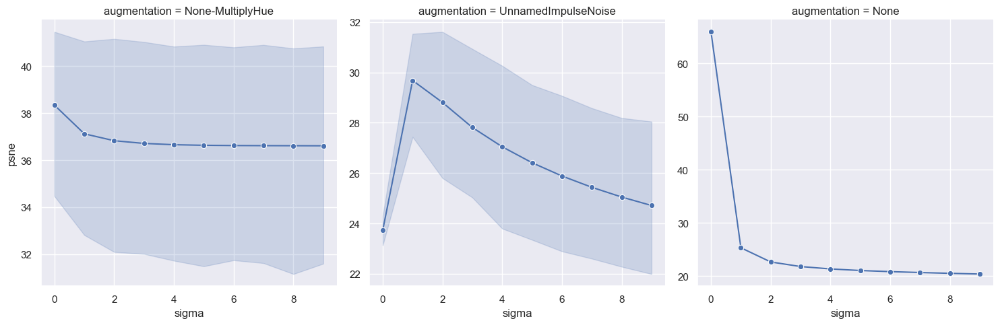

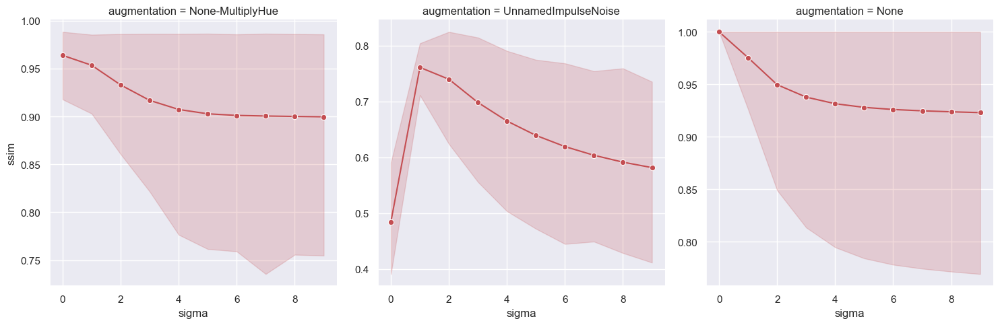

In [99]:
# mean and 95% ci

sns.relplot(
    data=df_gaussian_noise_detector_ycbcr_all_dataset, x='sigma', y='psne', marker='o', color='b',
    col="augmentation",
    kind="line",
    facet_kws={'sharey': False, 'sharex': False}
)
sns.relplot(
    data=df_gaussian_noise_detector_ycbcr_all_dataset, x='sigma', y='ssim', marker='o', color='r',
    col="augmentation",
    kind="line",
    facet_kws={'sharey': False, 'sharex': False}
)

plt.show()

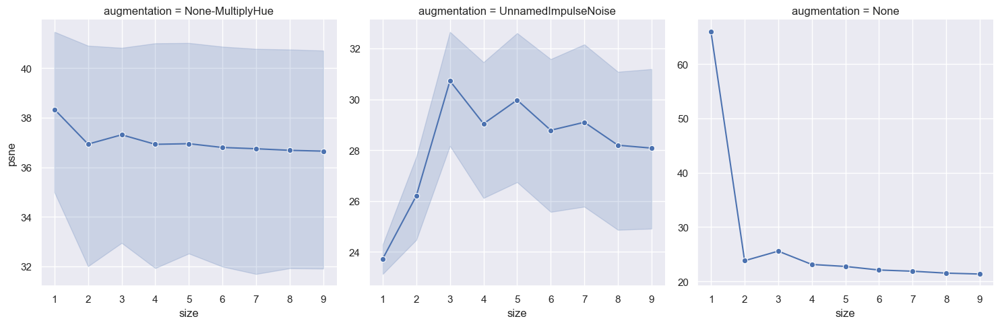

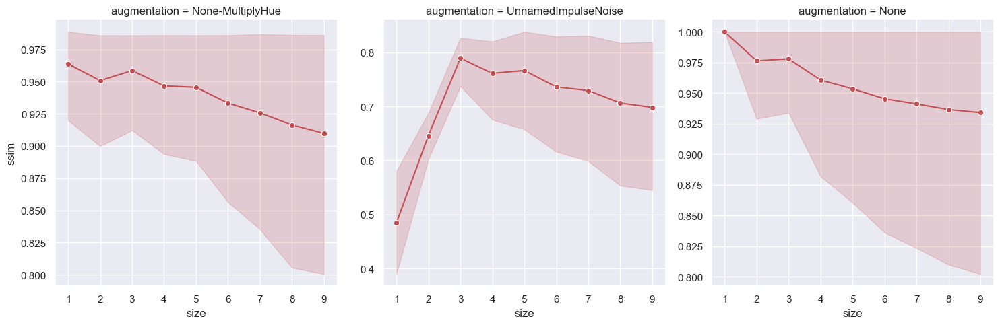

In [100]:
# mean and 95% ci

sns.relplot(
    data=df_median_noise_detector_ycbcr_all_dataset, x='size', y='psne', marker='o', color='b',
    col="augmentation",
    kind="line",
    facet_kws={'sharey': False, 'sharex': False}
)
sns.relplot(
    data=df_median_noise_detector_ycbcr_all_dataset, x='size', y='ssim', marker='o', color='r',
    col="augmentation",
    kind="line",
    facet_kws={'sharey': False, 'sharex': False}
)

plt.show()

### Denoise Wavelet

In [162]:
from skimage.restoration import denoise_wavelet


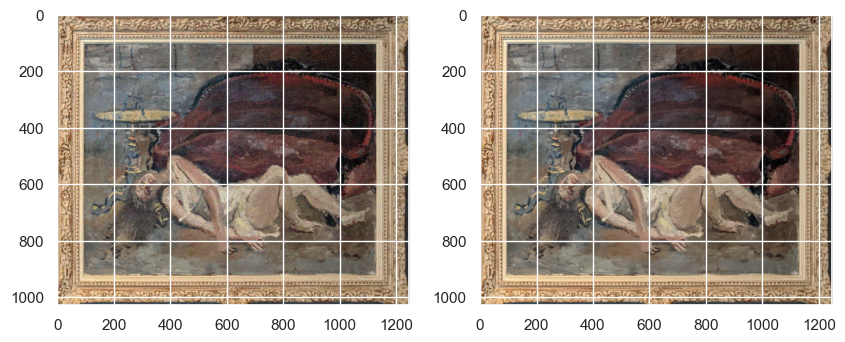

In [163]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # right side
display_image(noisy_img, ax1)
display_image(noisy_img_gt, ax2)
plt.show()


In [226]:
estimate_noise_wavelet(noisy_img)

(np.float64(8.15418828762046), np.True_)

In [236]:
denoised_img = denoise_wavelet(noisy_img, sigma=80, wavelet_levels=1, channel_axis=2, convert2ycbcr=True)

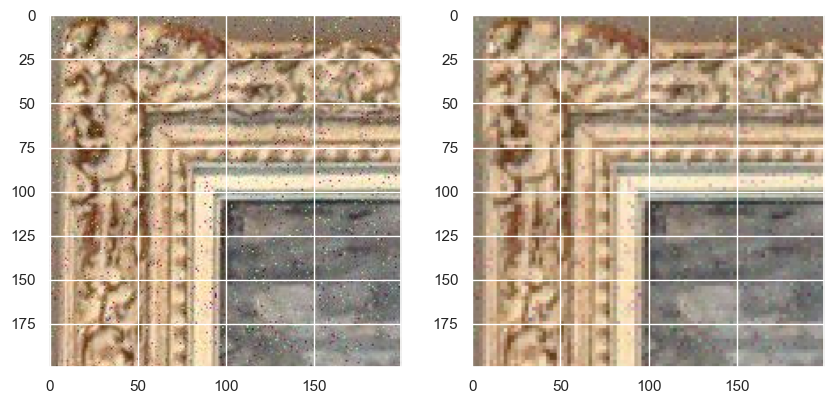

In [237]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # right side
display_image(noisy_img[:200,:200,:], ax1)
display_image((denoised_img*255).astype(np.uint8)[:200,:200,:], ax2)
plt.show()


In [247]:
from src.data import remove_noise 

In [250]:
denoised_image = remove_noise.denoise_wavelet(noisy_img)

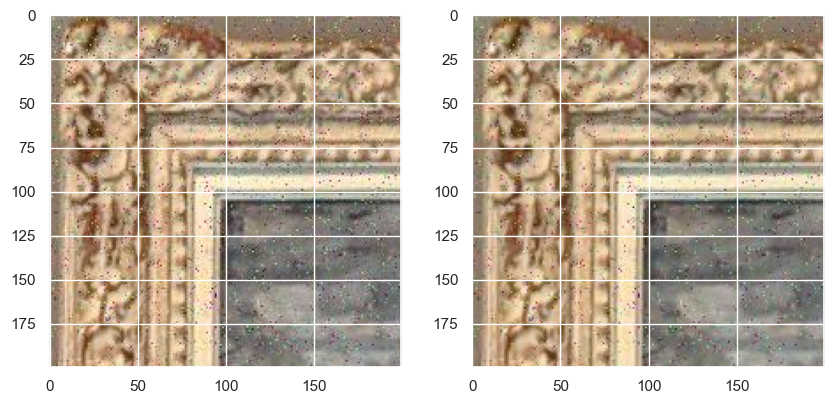

In [253]:
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # right side
display_image(noisy_img[:200,:200,:], ax1)
display_image(denoised_image[:200,:200,:], ax2)
plt.show()


## Experimentation with different types of noise

In [9]:
from src.data.evaluate_noise_removal import add_noise, compute_psne, compute_ssim
from src.data import remove_noise, detect_noise
import cv2

In [10]:
# artifficially add noise to the raw images
noisy_images_path = "data/raw/qsd1_w3/noisy"
os.makedirs(noisy_images_path, exist_ok=True)
for image_name in [el for el in os.listdir(gt_data_folder) if el.endswith(".jpg")]:
    img = read_image(os.path.join(gt_data_folder, image_name))

    noisy_gauss_1 = add_noise(img, "gaussian", var=0.01)
    noisy_sp_1 = add_noise(img, "salt_pepper", amount=0.02)
    noisy_uniform_1 = add_noise(img, "uniform", amount=0.1)

    noisy_gauss_2 = add_noise(img, "gaussian", var=0.02)
    noisy_sp_2 = add_noise(img, "salt_pepper", amount=0.04)
    noisy_uniform_2 = add_noise(img, "uniform", amount=0.2)

    img_name_clean = image_name.split(".jpg")[0]

    cv2.imwrite(os.path.join(noisy_images_path, img_name_clean+"_gauss_1.jpg"), noisy_gauss_1)
    cv2.imwrite(os.path.join(noisy_images_path, img_name_clean+"_gauss_2.jpg"), noisy_gauss_2)

    cv2.imwrite(os.path.join(noisy_images_path, img_name_clean+"_sp_1.jpg"), noisy_sp_1)
    cv2.imwrite(os.path.join(noisy_images_path, img_name_clean+"_sp_2.jpg"), noisy_sp_2)

    cv2.imwrite(os.path.join(noisy_images_path, img_name_clean+"_uniform_1.jpg"), noisy_uniform_1)
    cv2.imwrite(os.path.join(noisy_images_path, img_name_clean+"_uniform_2.jpg"), noisy_uniform_1)


### Noise detection

In [11]:
# test the noise detectors with these newly noisy created images

noise_classification_noisy_img = []
for image_name in sorted([el for el in os.listdir(noisy_images_path) if el.endswith(".jpg")]):

    input_img = read_image(os.path.join(noisy_images_path, image_name)) 
    threshold_fft, noise_pred_fft = detect_noise.estimate_noise_fft(input_img)

    sigma_wavelet, noise_pred_wavelet = detect_noise.estimate_noise_wavelet(input_img)

    noise_pred_laplace = detect_noise.noise_detector_laplace(input_img)

    noise_pred_grad = detect_noise.noise_detector_grad(input_img)

    noise_classification_noisy_img.append({
        'image': image_name,
        'noise_type': '_'.join(image_name.split('_')[-2:])[:-4],
        'threshold_fft': threshold_fft,
        'noise_pred_fft': noise_pred_fft,
        'sigma_wavelet': sigma_wavelet,
        'noise_pred_wavelet': noise_pred_wavelet,
        'noise_pred_laplace': noise_pred_laplace,
        'noise_pred_grad': noise_pred_grad
    })
noise_pred_df = pd.DataFrame(noise_classification_noisy_img)
noise_pred_df.head()

,image,noise_type,threshold_fft,noise_pred_fft,sigma_wavelet,noise_pred_wavelet,noise_pred_laplace,noise_pred_grad
0,00000_gauss_1.jpg,gauss_1,4.282698,True,16.308377,True,True,True
1,00000_gauss_2.jpg,gauss_2,5.518448,True,22.238695,True,True,True
2,00000_sp_1.jpg,sp_1,7.113588,True,4.447739,False,True,False
3,00000_sp_2.jpg,sp_2,9.469165,True,5.930319,True,True,True
4,00000_uniform_1.jpg,uniform_1,3.103663,False,10.378058,True,True,True


In [12]:
# test the noise detectors with these newly noisy created images

noise_classification_clear_img = []
for image_name in sorted([el for el in os.listdir(gt_data_folder) if el.endswith(".jpg")]):

    input_img = read_image(os.path.join(gt_data_folder, image_name)) 
    threshold_fft, noise_pred_fft = detect_noise.estimate_noise_fft(input_img)

    sigma_wavelet, noise_pred_wavelet = detect_noise.estimate_noise_wavelet(input_img)

    noise_pred_laplace = detect_noise.noise_detector_laplace(input_img)

    noise_pred_grad = detect_noise.noise_detector_grad(input_img)

    noise_classification_clear_img.append({
        'image': image_name,
        'noise_type': "None",
        'threshold_fft': threshold_fft,
        'noise_pred_fft': noise_pred_fft,
        'sigma_wavelet': sigma_wavelet,
        'noise_pred_wavelet': noise_pred_wavelet,
        'noise_pred_laplace': noise_pred_laplace,
        'noise_pred_grad': noise_pred_grad
    })
noise_pred_df = pd.DataFrame(noise_classification_clear_img)
noise_pred_df.head()

,image,noise_type,threshold_fft,noise_pred_fft,sigma_wavelet,noise_pred_wavelet,noise_pred_laplace,noise_pred_grad
0,00000.jpg,None,1.939513,False,1.280275e-14,False,False,False
1,00001.jpg,None,1.363036,False,7.412898e-01,False,False,False
2,00002.jpg,None,3.000571,False,2.204626e-15,False,False,False
3,00003.jpg,None,1.310881,False,1.482580e+00,False,False,False
4,00004.jpg,None,1.557287,False,7.412898e-01,False,False,False


In [13]:
noise_pred_df = pd.DataFrame(noise_classification_noisy_img+noise_classification_clear_img)
noise_pred_df

,image,noise_type,threshold_fft,noise_pred_fft,sigma_wavelet,noise_pred_wavelet,noise_pred_laplace,noise_pred_grad
0,00000_gauss_1.jpg,gauss_1,4.282698,True,1.630838e+01,True,True,True
1,00000_gauss_2.jpg,gauss_2,5.518448,True,2.223870e+01,True,True,True
2,00000_sp_1.jpg,sp_1,7.113588,True,4.447739e+00,False,True,False
3,00000_sp_2.jpg,sp_2,9.469165,True,5.930319e+00,True,True,True
4,00000_uniform_1.jpg,uniform_1,3.103663,False,1.037806e+01,True,True,True
...,...,...,...,...,...,...,...,...
205,00025.jpg,None,1.168041,False,7.412898e-01,False,False,False
206,00026.jpg,None,1.758097,False,7.310552e-17,False,False,False
207,00027.jpg,None,4.530004,True,5.189029e+00,True,True,True
208,00028.jpg,None,4.135076,True,1.186064e+01,True,True,True


In [14]:
noise_pred_df['original_noise'] = noise_pred_df['noise_type'].apply(lambda x: False if x=="None" else True)

In [15]:
noise_pred_df

,image,noise_type,threshold_fft,noise_pred_fft,sigma_wavelet,noise_pred_wavelet,noise_pred_laplace,noise_pred_grad,original_noise
0,00000_gauss_1.jpg,gauss_1,4.282698,True,1.630838e+01,True,True,True,True
1,00000_gauss_2.jpg,gauss_2,5.518448,True,2.223870e+01,True,True,True,True
2,00000_sp_1.jpg,sp_1,7.113588,True,4.447739e+00,False,True,False,True
3,00000_sp_2.jpg,sp_2,9.469165,True,5.930319e+00,True,True,True,True
4,00000_uniform_1.jpg,uniform_1,3.103663,False,1.037806e+01,True,True,True,True
...,...,...,...,...,...,...,...,...,...
205,00025.jpg,None,1.168041,False,7.412898e-01,False,False,False,False
206,00026.jpg,None,1.758097,False,7.310552e-17,False,False,False,False
207,00027.jpg,None,4.530004,True,5.189029e+00,True,True,True,False
208,00028.jpg,None,4.135076,True,1.186064e+01,True,True,True,False


#### Confusion matrices

In [16]:
print("FFT")
print(confusion_matrix(noise_pred_df['original_noise'], noise_pred_df['noise_pred_fft'], labels=[True, False]))
print("Wavelet")
print(confusion_matrix(noise_pred_df['original_noise'], noise_pred_df['noise_pred_wavelet'], labels=[True, False]))
print("Laplace")
print(confusion_matrix(noise_pred_df['original_noise'], noise_pred_df['noise_pred_laplace'], labels=[True, False]))
print("Grad")
print(confusion_matrix(noise_pred_df['original_noise'], noise_pred_df['noise_pred_grad'], labels=[True, False]))


FFT
[[146  34]
 [  3  27]]
Wavelet
[[154  26]
 [  3  27]]
Laplace
[[170  10]
 [  3  27]]
Grad
[[156  24]
 [  3  27]]


In [17]:
noise_pred_gauss1_df = noise_pred_df[noise_pred_df['noise_type'] == 'gauss_1']

print("FFT")
print(confusion_matrix(noise_pred_gauss1_df['original_noise'], noise_pred_gauss1_df['noise_pred_fft'], labels=[True, False]))
print("Wavelet")
print(confusion_matrix(noise_pred_gauss1_df['original_noise'], noise_pred_gauss1_df['noise_pred_wavelet'], labels=[True, False]))
print("Laplace")
print(confusion_matrix(noise_pred_gauss1_df['original_noise'], noise_pred_gauss1_df['noise_pred_laplace'], labels=[True, False]))
print("Grad")
print(confusion_matrix(noise_pred_gauss1_df['original_noise'], noise_pred_gauss1_df['noise_pred_grad'], labels=[True, False]))

FFT
[[28  2]
 [ 0  0]]
Wavelet
[[30  0]
 [ 0  0]]
Laplace
[[30  0]
 [ 0  0]]
Grad
[[30  0]
 [ 0  0]]


In [18]:
noise_pred_gauss2_df = noise_pred_df[noise_pred_df['noise_type'] == 'gauss_2']

print("FFT")
print(confusion_matrix(noise_pred_gauss2_df['original_noise'], noise_pred_gauss2_df['noise_pred_fft'], labels=[True, False]))
print("Wavelet")
print(confusion_matrix(noise_pred_gauss2_df['original_noise'], noise_pred_gauss2_df['noise_pred_wavelet'], labels=[True, False]))
print("Laplace")
print(confusion_matrix(noise_pred_gauss2_df['original_noise'], noise_pred_gauss2_df['noise_pred_laplace'], labels=[True, False]))
print("Grad")
print(confusion_matrix(noise_pred_gauss2_df['original_noise'], noise_pred_gauss2_df['noise_pred_grad'], labels=[True, False]))

FFT
[[30  0]
 [ 0  0]]
Wavelet
[[30  0]
 [ 0  0]]
Laplace
[[30  0]
 [ 0  0]]
Grad
[[30  0]
 [ 0  0]]


In [19]:
noise_pred_sp1_df = noise_pred_df[noise_pred_df['noise_type'] == 'sp_1']

print("FFT")
print(confusion_matrix(noise_pred_sp1_df['original_noise'], noise_pred_sp1_df['noise_pred_fft'], labels=[True, False]))
print("Wavelet")
print(confusion_matrix(noise_pred_sp1_df['original_noise'], noise_pred_sp1_df['noise_pred_wavelet'], labels=[True, False]))
print("Laplace")
print(confusion_matrix(noise_pred_sp1_df['original_noise'], noise_pred_sp1_df['noise_pred_laplace'], labels=[True, False]))
print("Grad")
print(confusion_matrix(noise_pred_sp1_df['original_noise'], noise_pred_sp1_df['noise_pred_grad'], labels=[True, False]))

FFT
[[30  0]
 [ 0  0]]
Wavelet
[[ 4 26]
 [ 0  0]]
Laplace
[[20 10]
 [ 0  0]]
Grad
[[ 6 24]
 [ 0  0]]


In [20]:
noise_pred_sp2_df = noise_pred_df[noise_pred_df['noise_type'] == 'sp_2']

print("FFT")
print(confusion_matrix(noise_pred_sp2_df['original_noise'], noise_pred_sp2_df['noise_pred_fft'], labels=[True, False]))
print("Wavelet")
print(confusion_matrix(noise_pred_sp2_df['original_noise'], noise_pred_sp2_df['noise_pred_wavelet'], labels=[True, False]))
print("Laplace")
print(confusion_matrix(noise_pred_sp2_df['original_noise'], noise_pred_sp2_df['noise_pred_laplace'], labels=[True, False]))
print("Grad")
print(confusion_matrix(noise_pred_sp2_df['original_noise'], noise_pred_sp2_df['noise_pred_grad'], labels=[True, False]))

FFT
[[30  0]
 [ 0  0]]
Wavelet
[[30  0]
 [ 0  0]]
Laplace
[[30  0]
 [ 0  0]]
Grad
[[30  0]
 [ 0  0]]


In [21]:
noise_pred_uniform1_df = noise_pred_df[noise_pred_df['noise_type'] == 'uniform_1']

print("FFT")
print(confusion_matrix(noise_pred_uniform1_df['original_noise'], noise_pred_uniform1_df['noise_pred_fft'], labels=[True, False]))
print("Wavelet")
print(confusion_matrix(noise_pred_uniform1_df['original_noise'], noise_pred_uniform1_df['noise_pred_wavelet'], labels=[True, False]))
print("Laplace")
print(confusion_matrix(noise_pred_uniform1_df['original_noise'], noise_pred_uniform1_df['noise_pred_laplace'], labels=[True, False]))
print("Grad")
print(confusion_matrix(noise_pred_uniform1_df['original_noise'], noise_pred_uniform1_df['noise_pred_grad'], labels=[True, False]))

FFT
[[14 16]
 [ 0  0]]
Wavelet
[[30  0]
 [ 0  0]]
Laplace
[[30  0]
 [ 0  0]]
Grad
[[30  0]
 [ 0  0]]


In [22]:
noise_pred_uniform2_df = noise_pred_df[noise_pred_df['noise_type'] == 'uniform_2']

print("FFT")
print(confusion_matrix(noise_pred_uniform2_df['original_noise'], noise_pred_uniform2_df['noise_pred_fft'], labels=[True, False]))
print("Wavelet")
print(confusion_matrix(noise_pred_uniform2_df['original_noise'], noise_pred_uniform2_df['noise_pred_wavelet'], labels=[True, False]))
print("Laplace")
print(confusion_matrix(noise_pred_uniform2_df['original_noise'], noise_pred_uniform2_df['noise_pred_laplace'], labels=[True, False]))
print("Grad")
print(confusion_matrix(noise_pred_uniform2_df['original_noise'], noise_pred_uniform2_df['noise_pred_grad'], labels=[True, False]))

FFT
[[14 16]
 [ 0  0]]
Wavelet
[[30  0]
 [ 0  0]]
Laplace
[[30  0]
 [ 0  0]]
Grad
[[30  0]
 [ 0  0]]


### Noise removal

In [23]:
# test the noise removal modules with these newly noisy created images

noise_removal_metrics = []
for image_name in sorted([el for el in os.listdir(noisy_images_path) if el.endswith(".jpg")]):

    original_image_name = "_".join(image_name.split("_")[:-2])+'.jpg'
    gt_img = read_image(os.path.join(gt_data_folder, original_image_name))
    noisy_img = read_image(os.path.join(noisy_images_path, image_name))

    # apply different filters
    noise_removed_gaussian = remove_noise.apply_gaussian_filter(noisy_img)
    noise_removed_median = remove_noise.apply_gaussian_filter(noisy_img)
    noise_removed_wavelet = remove_noise.denoise_wavelet(noisy_img)

    # compute metrics of denoised images
    gaussian_psne = compute_psne(gt_img, noise_removed_gaussian)
    gaussian_ssim = compute_ssim(gt_img, noise_removed_gaussian)
    median_psne = compute_psne(gt_img, noise_removed_median)
    median_ssim = compute_ssim(gt_img, noise_removed_median)
    wavelet_psne = compute_psne(gt_img, noise_removed_wavelet)
    wavelet_ssim = compute_ssim(gt_img, noise_removed_wavelet)

    noise_removal_metrics.append({
        'image': image_name,
        'gaussian_psne': gaussian_psne,
        'gaussian_ssim': gaussian_ssim,
        'median_psne': median_psne,
        'median_ssim': median_ssim,
        'wavelet_psne': wavelet_psne,
        'wavelet_ssim': wavelet_ssim
    })

noise_removal_metrics_df = pd.DataFrame(noise_removal_metrics)
noise_removal_metrics_df.head()

,image,gaussian_psne,gaussian_ssim,median_psne,median_ssim,wavelet_psne,wavelet_ssim
0,00000_gauss_1.jpg,27.324686,0.708804,27.324686,0.708804,27.325467,0.648718
1,00000_gauss_2.jpg,25.954349,0.613854,25.954349,0.613854,25.090190,0.538018
2,00000_sp_1.jpg,25.584478,0.611571,25.584478,0.611571,18.406882,0.344686
3,00000_sp_2.jpg,23.283606,0.482447,23.283606,0.482447,16.800676,0.228815
4,00000_uniform_1.jpg,28.533526,0.810177,28.533526,0.810177,30.733264,0.789411


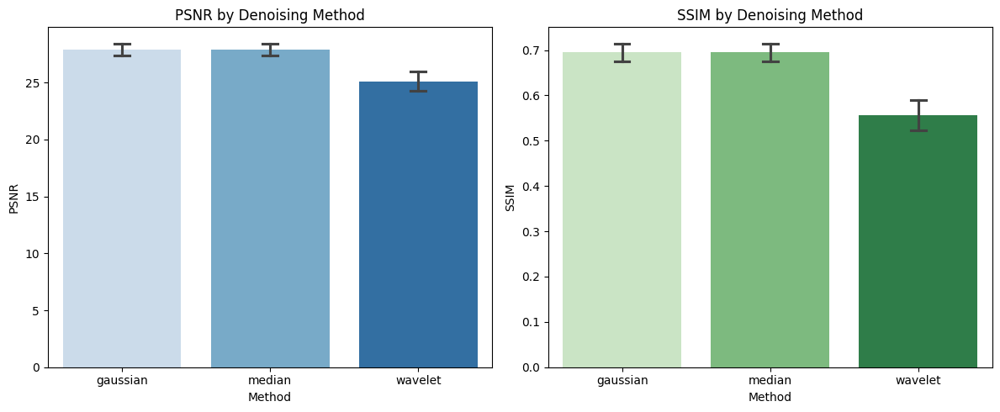

In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame to long format
melted_df = noise_removal_metrics_df.melt(
    id_vars="image",
    value_vars=[
        "gaussian_psne", "median_psne", "wavelet_psne",
        "gaussian_ssim", "median_ssim", "wavelet_ssim"
    ],
    var_name="method_metric",
    value_name="value"
)

# Split into 'method' and 'metric' columns
melted_df[["method", "metric"]] = melted_df["method_metric"].str.split("_", expand=True)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=False)

# Define palettes (optional)
palette_psne = "Blues"
palette_ssim = "Greens"

# Plot PSNR
sns.barplot(
    data=melted_df[melted_df["metric"] == "psne"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[0], palette=palette_psne, legend=False
)
axes[0].set_title("PSNR by Denoising Method")
axes[0].set_xlabel("Method")
axes[0].set_ylabel("PSNR")

# Plot SSIM
sns.barplot(
    data=melted_df[melted_df["metric"] == "ssim"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[1], palette=palette_ssim, legend=False
)
axes[1].set_title("SSIM by Denoising Method")
axes[1].set_xlabel("Method")
axes[1].set_ylabel("SSIM")

plt.tight_layout()
plt.show()


In [33]:
gauss_1 = melted_df[melted_df['image'].str.contains("gauss_1")]

In [34]:
gauss_1

,image,method_metric,value,method,metric
0,00000_gauss_1.jpg,gaussian_psne,27.324686,gaussian,psne
6,00001_gauss_1.jpg,gaussian_psne,30.150839,gaussian,psne
12,00002_gauss_1.jpg,gaussian_psne,29.958065,gaussian,psne
18,00003_gauss_1.jpg,gaussian_psne,29.546660,gaussian,psne
24,00004_gauss_1.jpg,gaussian_psne,29.995370,gaussian,psne
...,...,...,...,...,...
1050,00025_gauss_1.jpg,wavelet_ssim,0.622071,wavelet,ssim
1056,00026_gauss_1.jpg,wavelet_ssim,0.626340,wavelet,ssim
1062,00027_gauss_1.jpg,wavelet_ssim,0.701320,wavelet,ssim
1068,00028_gauss_1.jpg,wavelet_ssim,0.889985,wavelet,ssim


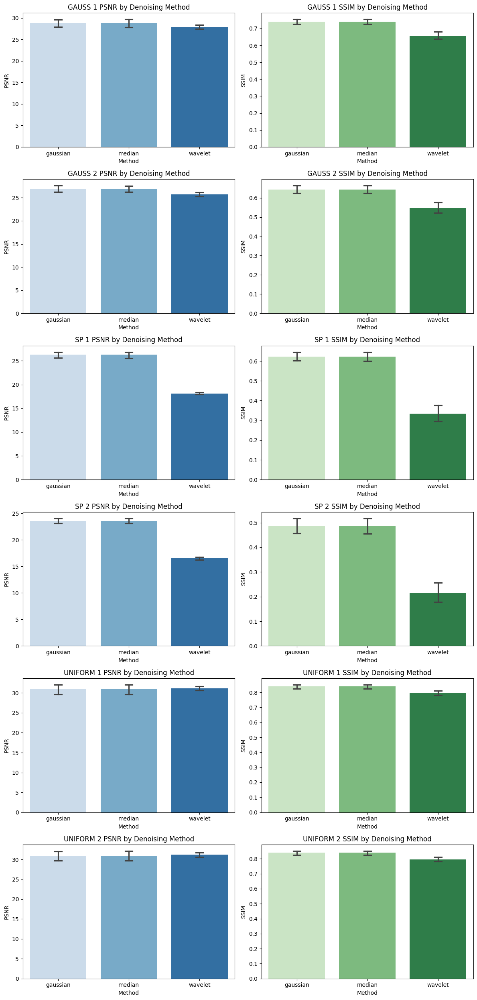

In [41]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame to long format
melted_df = noise_removal_metrics_df.melt(
    id_vars="image",
    value_vars=[
        "gaussian_psne", "median_psne", "wavelet_psne",
        "gaussian_ssim", "median_ssim", "wavelet_ssim"
    ],
    var_name="method_metric",
    value_name="value"
)

# Split into 'method' and 'metric' columns
melted_df[["method", "metric"]] = melted_df["method_metric"].str.split("_", expand=True)

# Create subplots
fig, axes = plt.subplots(6, 2, figsize=(12, 25), sharey=False, sharex=False)

# Define palettes (optional)
palette_psne = "Blues"
palette_ssim = "Greens"

gauss_1 = melted_df[melted_df['image'].str.contains("gauss_1")]

# Plot PSNR
sns.barplot(
    data=gauss_1[gauss_1["metric"] == "psne"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[0][0], palette=palette_psne, legend=False
)
axes[0][0].set_title("GAUSS 1 PSNR by Denoising Method")
axes[0][0].set_xlabel("Method")
axes[0][0].set_ylabel("PSNR")

# Plot SSIM
sns.barplot(
    data=gauss_1[gauss_1["metric"] == "ssim"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[0][1], palette=palette_ssim, legend=False
)
axes[0][1].set_title("GAUSS 1 SSIM by Denoising Method")
axes[0][1].set_xlabel("Method")
axes[0][1].set_ylabel("SSIM")

gauss_2 = melted_df[melted_df['image'].str.contains("gauss_2")]

# Plot PSNR
sns.barplot(
    data=gauss_2[gauss_2["metric"] == "psne"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[1][0], palette=palette_psne, legend=False
)
axes[1][0].set_title("GAUSS 2 PSNR by Denoising Method")
axes[1][0].set_xlabel("Method")
axes[1][0].set_ylabel("PSNR")

# Plot SSIM
sns.barplot(
    data=gauss_2[gauss_2["metric"] == "ssim"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[1][1], palette=palette_ssim, legend=False
)
axes[1][1].set_title("GAUSS 2 SSIM by Denoising Method")
axes[1][1].set_xlabel("Method")
axes[1][1].set_ylabel("SSIM")

sp_1 = melted_df[melted_df['image'].str.contains("sp_1")]

# Plot PSNR
sns.barplot(
    data=sp_1[sp_1["metric"] == "psne"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[2][0], palette=palette_psne, legend=False
)
axes[2][0].set_title("SP 1 PSNR by Denoising Method")
axes[2][0].set_xlabel("Method")
axes[2][0].set_ylabel("PSNR")

# Plot SSIM
sns.barplot(
    data=sp_1[sp_1["metric"] == "ssim"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[2][1], palette=palette_ssim, legend=False
)
axes[2][1].set_title("SP 1 SSIM by Denoising Method")
axes[2][1].set_xlabel("Method")
axes[2][1].set_ylabel("SSIM")


sp_2 = melted_df[melted_df['image'].str.contains("sp_2")]

# Plot PSNR
sns.barplot(
    data=sp_2[sp_2["metric"] == "psne"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[3][0], palette=palette_psne, legend=False
)
axes[3][0].set_title("SP 2 PSNR by Denoising Method")
axes[3][0].set_xlabel("Method")
axes[3][0].set_ylabel("PSNR")

# Plot SSIM
sns.barplot(
    data=sp_2[sp_2["metric"] == "ssim"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[3][1], palette=palette_ssim, legend=False
)
axes[3][1].set_title("SP 2 SSIM by Denoising Method")
axes[3][1].set_xlabel("Method")
axes[3][1].set_ylabel("SSIM")

uniform_1 = melted_df[melted_df['image'].str.contains("uniform_1")]

# Plot PSNR
sns.barplot(
    data=uniform_1[uniform_1["metric"] == "psne"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[4][0], palette=palette_psne, legend=False
)
axes[4][0].set_title("UNIFORM 1 PSNR by Denoising Method")
axes[4][0].set_xlabel("Method")
axes[4][0].set_ylabel("PSNR")

# Plot SSIM
sns.barplot(
    data=uniform_1[uniform_1["metric"] == "ssim"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[4][1], palette=palette_ssim, legend=False
)
axes[4][1].set_title("UNIFORM 1 SSIM by Denoising Method")
axes[4][1].set_xlabel("Method")
axes[4][1].set_ylabel("SSIM")


uniform_2 = melted_df[melted_df['image'].str.contains("uniform_2")]

# Plot PSNR
sns.barplot(
    data=uniform_2[uniform_2["metric"] == "psne"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[5][0], palette=palette_psne, legend=False
)
axes[5][0].set_title("UNIFORM 2 PSNR by Denoising Method")
axes[5][0].set_xlabel("Method")
axes[5][0].set_ylabel("PSNR")

# Plot SSIM
sns.barplot(
    data=uniform_2[uniform_2["metric"] == "ssim"],
    x="method", y="value", hue="method",
    errorbar="ci", capsize=.1,
    ax=axes[5][1], palette=palette_ssim, legend=False
)
axes[5][1].set_title("UNIFORM 2 SSIM by Denoising Method")
axes[5][1].set_xlabel("Method")
axes[5][1].set_ylabel("SSIM")

plt.tight_layout()
plt.show()
